In [1]:
%load_ext autoreload
%autoreload 2
import geopandas as gpd
import pandas as pd
import ast
import shapely
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import LineString
import scipy as sc
import re
from tqdm import tqdm
import xarray as xr
import os
from sklearn.cluster import KMeans
from sklearn.metrics import r2_score

directory = '/scratch/6256481/'

import sys
sys.path.insert(0, directory + f'python/py_code/')
from sklearn.neighbors import NearestNeighbors


from support import str_to_list, expand_dataframe
from support import shaped_lineair
from calc_functions import confinement_values
import json

from glob import glob
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib as mpl


# from main import main


from calc_functions import x_y_intercept
import shapely
import ast


from run_confinement_values import create_apex_val_dataframe, calc_confinement_values


# open Files

In [2]:
cross = 50
allFiles        = np.sort(glob(directory + 'results/all/??_??_50.csv'))
singleFiles     = np.sort(glob(directory + 'results/single_values/??_??_50.csv'))
singleConfFiles = np.sort(glob(directory + f'results/single_values/*50*conf.nc'))
reachAveraged   = np.sort(glob(directory + f'results/reach_averaged/*50*.gpkg'))

In [8]:
singleFiles

array(['/scratch/6256481/results/single_values/af_00_50.csv',
       '/scratch/6256481/results/single_values/af_01_50.csv',
       '/scratch/6256481/results/single_values/af_02_50.csv',
       '/scratch/6256481/results/single_values/af_03_50.csv',
       '/scratch/6256481/results/single_values/af_04_50.csv',
       '/scratch/6256481/results/single_values/as_00_50.csv',
       '/scratch/6256481/results/single_values/as_01_50.csv',
       '/scratch/6256481/results/single_values/as_02_50.csv',
       '/scratch/6256481/results/single_values/as_03_50.csv',
       '/scratch/6256481/results/single_values/as_04_50.csv',
       '/scratch/6256481/results/single_values/as_05_50.csv',
       '/scratch/6256481/results/single_values/as_06_50.csv',
       '/scratch/6256481/results/single_values/as_07_50.csv',
       '/scratch/6256481/results/single_values/as_08_50.csv',
       '/scratch/6256481/results/single_values/as_09_50.csv',
       '/scratch/6256481/results/single_values/as_10_50.csv',
       '

In [56]:
D = xr.open_dataset(singleConfFiles[27])
D = D.to_dataframe()

In [4]:
len(singleConfFiles)
singleConfFiles


array(['/scratch/6256481/results/single_values/af_00_50_conf.nc',
       '/scratch/6256481/results/single_values/af_01_50_conf.nc',
       '/scratch/6256481/results/single_values/af_02_50_conf.nc',
       '/scratch/6256481/results/single_values/af_03_50_conf.nc',
       '/scratch/6256481/results/single_values/af_04_50_conf.nc',
       '/scratch/6256481/results/single_values/as_00_50_conf.nc',
       '/scratch/6256481/results/single_values/as_01_50_conf.nc',
       '/scratch/6256481/results/single_values/as_02_50_conf.nc',
       '/scratch/6256481/results/single_values/as_03_50_conf.nc',
       '/scratch/6256481/results/single_values/as_04_50_conf.nc',
       '/scratch/6256481/results/single_values/as_05_50_conf.nc',
       '/scratch/6256481/results/single_values/as_06_50_conf.nc',
       '/scratch/6256481/results/single_values/as_07_50_conf.nc',
       '/scratch/6256481/results/single_values/as_08_50_conf.nc',
       '/scratch/6256481/results/single_values/as_09_50_conf.nc',
       '/s

In [18]:
for f in singleConfFiles[0:1]:
    D = xr.open_dataset(f)
    D = D.to_dataframe()
    create_gpkg(D, f)

In [9]:
dfS = pd.read_csv(singleFiles[4])
# dfE = pd.read_csv(allFiles[4], dtype = {'include_flag': str, 'calculated': str})


In [6]:
dfE[(dfE['include_flag'] == '0') & (dfE['calculated'] == '0')].shape[0], dfE[(dfE['include_flag'] == '0') & (dfE['calculated'] != '0')].shape[0]

(1036, 0)

In [19]:
dfS.columns

Index(['Unnamed: 0', 'combined_reach_id', 'reach_id', 'reach_len', 'n_nodes',
       'wse', 'width', 'facc', 'n_chan_max', 'n_chan_mod', 'obstr_type',
       'grod_id', 'hfalls_id', 'slope', 'dist_out', 'lakeflag', 'max_width',
       'n_rch_up', 'n_rch_dn', 'rch_id_up', 'rch_id_dn', 'swot_orbit', 'type',
       'river_name', 'path_freq', 'path_order', 'path_segs', 'main_side',
       'strm_order', 'end_reach', 'network', 'include_flag', 'pfaf1', 'pfaf2',
       'localCRS', 'rch_id_up_orig', 'rch_id_dn_orig', 'n_rch_up_orig',
       'n_rch_dn_orig', 'node_mean_max_width', 'dn_connected_reach',
       'river_segment', 'river_segment_order', 'reach_order',
       'dn_river_segment', 'combined_reach_len', 'combined_reach_width',
       'combined_reach_max_width', 'networkGraph', 'networkGroup',
       'max_dist_out', 'up_reach_id', 'catchment_position', 'geometry',
       'widthRatio', 'combined_reach_crs', 'sin', 'bendSin', 'apex', 'apexP',
       'ang', 'infP', 'bendLines', 'bendWidths'

In [12]:
dfS.sort_values('width', ascending = False)

,Unnamed: 0,combined_reach_id,reach_id,reach_len,n_nodes,wse,width,facc,n_chan_max,n_chan_mod,...,elevInn,distOut,distInn,lineOut,lineInn,LROrthog,lineSlope,bendHeight,calculated,reach_ids
1557,1557,12831.0,18170900055,12181.907694,61,0.000000,3430.000000,72.507050,12,4,...,"[3.3100002, 3.3, 3.3, 3.3100002, 3.3100002, 3....","[0.0, 75.00000000000807, 150.00000000001614, 2...","[0.0, 75.00000000000807, 150.00000000001614, 2...",LINESTRING (655850.4606660705 8231304.39395082...,LINESTRING (655850.4606660705 8231304.39395082...,0.0,0.000087,3.497050,0,[18170900055 18170900065 18180100103 18180100095]
7695,7695,13283.0,18194000161,1006.609473,5,752.099976,1355.000000,6164.683369,3,1,...,"[750.82, 750.84, 750.83, 750.86005, 750.93, 75...","[0.0, 74.9999999999982, 149.99999999999636, 22...","[0.0, 74.9999999999982, 149.99999999999636, 22...",LINESTRING (232480.98676084893 8047366.0529346...,LINESTRING (232480.98676084893 8047366.0529346...,0.0,-0.000226,750.877808,0,[18194000161 18194000171]
1582,1582,12836.0,18191000305,7257.718330,36,0.000000,784.000000,56134.363281,4,1,...,"[0.0, 0.0, 0.0, 4.45, 4.33, 3.97, 3.87, 3.89, ...","[0.0, 75.00000000023014, 149.99999999977257, 2...","[0.0, 75.00000000023014, 149.99999999977257, 2...",LINESTRING (659113.1157469744 8237361.23171377...,LINESTRING (659113.1157469744 8237361.23171377...,0.0,0.000172,1.065975,0,[18191000305 18191000315]
1581,1581,12836.0,18191000305,7257.718330,36,0.000000,784.000000,56134.363281,4,1,...,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.04, 3.2, 3.34...","[0.0, 74.99999999978805, 150.0000000003419, 22...","[0.0, 74.99999999978805, 150.0000000003419, 22...",LINESTRING (663929.2030237921 8231677.79944437...,LINESTRING (663929.2030237921 8231677.79944437...,1.0,0.000172,0.195075,0,[18191000305 18191000315]
1583,1583,12836.0,18191000305,7257.718330,36,0.000000,784.000000,56134.363281,4,1,...,"[9.21, 9.54, 12.3, 12.47, 12.37, 12.22, 11.329...","[0.0, 75.00000000003068, 149.9999999999448, 22...","[0.0, 75.00000000003068, 149.9999999999448, 22...",LINESTRING (651312.5193170456 8242655.54844844...,LINESTRING (651312.5193170456 8242655.54844844...,0.0,0.000172,6.806450,0,[18191000305 18191000315]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8189,8189,13317.0,18195000161,12945.202638,65,13.800000,36.000000,397.245937,1,1,...,"[21.32, 21.980001, 21.980001, 21.980001, 21.98...","[0.0, 4.781249999957205, 9.562499999961503, 14...","[0.0, 4.781249999957205, 9.562499999961503, 14...",LINESTRING (308616.468877322 7976205.002264539...,LINESTRING (308616.468877322 7976205.002264539...,1.0,-0.002208,19.529247,0,[18195000161]
865,865,12781.0,18170800851,5971.824366,30,13.000000,32.597069,192.833374,1,1,...,"[14.97, 14.97, 14.97, 14.97, 14.97, 14.97, 13....","[0.0, 3.7681011558039788, 7.536202311712581, 1...","[0.0, 3.7681011558039788, 7.536202311712581, 1...",LINESTRING (607605.6322524317 8220609.51875557...,LINESTRING (607605.6322524317 8220609.51875557...,1.0,-0.000273,14.357426,0,[18170800851]
866,866,12781.0,18170800851,5971.824366,30,13.000000,32.597069,192.833374,1,1,...,"[14.170001, 14.170001, 14.170001, 14.170001, 1...","[0.0, 4.07463359789684, 8.149267196707001, 12....","[0.0, 4.07463359789684, 8.149267196707001, 12....",LINESTRING (606811.2733317422 8219674.00019909...,LINESTRING (606811.2733317422 8219674.00019909...,1.0,-0.000273,13.881550,0,[18170800851]
867,867,12781.0,18170800851,5971.824366,30,13.000000,32.597069,192.833374,1,1,...,"[15.05, 15.05, 14.990001, 14.88, 15.12, 15.12,...","[0.0, 23.338840306030537, 46.677680612061074, ...","[0.0, 23.338840306030537, 46.677680612061074, ...",LINESTRING (605026.2721830247 8220514.75018715...,LINESTRING (605026.2721830247 8220514.75018715...,0.0,-0.000273,14.430725,0,[18170800851]


In [23]:
dfS[dfS['combined_reach_id'] == 13096.0]['bendLen']

5137     484.851500
5138    2163.850550
5139    1953.577231
5140     701.299421
5141    3734.598200
5142     498.508994
5143    5505.346339
5144     191.553087
Name: bendLen, dtype: float64

In [25]:
A = dfE.groupby(['combined_reach_id']).nunique()
A[A['reach_id'] > 1]
dfE[(dfE['include_flag'] == '0') & (dfE['calculated'] == '0')]['combined_reach_crs']

0       EPSG:32738
1       EPSG:32738
2       EPSG:32738
3       EPSG:32738
4       EPSG:32738
           ...    
1232    EPSG:32738
1233    EPSG:32738
1253    EPSG:32738
1254    EPSG:32738
1255    EPSG:32738
Name: combined_reach_crs, Length: 1036, dtype: object

In [16]:
A = dfS.groupby(['combined_reach_id']).nunique()
A[A['reach_id'] > 1]

,Unnamed: 0,reach_id,reach_len,n_nodes,wse,width,facc,n_chan_max,n_chan_mod,obstr_type,...,elevInn,distOut,distInn,lineOut,lineInn,LROrthog,lineSlope,bendHeight,calculated,reach_ids
combined_reach_id,,,,,,,,,,,,,,,,,,,,,


In [83]:
T = dfE[dfE['combined_reach_id'].isin([46847, 46848, 46846, 46845])].copy()
crid = T['combined_reach_id'].values
for i, r in T.iterrows():

    for col in ['distOut', 'bendLines']:
        
        colVal = r[col]
        if isinstance(colVal, float):
            colVal = np.nan
        elif isinstance(colVal, list):
            continue
        else:
            if col in ['distOut']:
                rc = r[col].replace('(', '').replace(')', '')
                colVal = json.loads(rc)
            else:
                colVal = ast.literal_eval(r[col])
        T.at[i, col] = colVal



In [ ]:
t = T.groupby('combined_reach_id', as_index = False).first().copy()
# t = T.copy()
t['reach_ids'] = None
for i, r in t.iterrows():
    reaches = T.loc[T['combined_reach_id'] == r['combined_reach_id'], 'reach_id'].values
    t.loc['combined_reach_crs']
    t.at[i , 'reach_ids'] = str(reaches)
    for col in ['distOut', 'bendLines']:
        colVal = r[col]
        if isinstance(colVal, float):
            colVal = np.nan
        elif isinstance(colVal, list):
            continue
        else:
            if col in ['distOut']:
                rc = r[col].replace('(', '').replace(')', '')
                colVal = json.loads(rc)
            else:
                colVal = ast.literal_eval(r[col])
        t.at[i, col] = colVal




In [115]:
from support import str_to_list_comb, str_to_list, expand_dataframe

In [107]:
listStrCols = ['LROrthog', 'bendMaxWidths', 'bendWidths', 'ang', 'bendSin', 'apex', 'bendDistOut', 'bendLen', 'bendHeight'] # new run needed
listStrCols = ['LROrthog', 'bendMaxWidths', 'bendWidths', 'ang', 'bendSin', 'apex', 'bendDistOut']
listGeomCols = ['apexP', 'lineInn', 'lineOut', 'bendLines']
listNestCols = ['distOut', 'distInn', 'elevInn', 'elevOut']

listCols = listStrCols + listGeomCols + listNestCols
dfInc = dfE[(dfE['include_flag'] == '0') & (dfE['calculated'] == '0')]

In [108]:
dfInc1 = str_to_list(dfInc, listCols, listNestCols)

In [113]:
dfInc2 =  str_to_list_comb(dfInc, listCols, listNestCols)

In [114]:
dfInc.shape[0], dfInc1.shape[0], dfInc2.shape[0]

(6711, 6711, 4484)

In [116]:
dfInc1 = expand_dataframe(dfInc1)
dfInc2 = expand_dataframe(dfInc2)

In [118]:
dfInc2

,combined_reach_id,x,y,reach_id,reach_len,n_nodes,wse,wse_var,width,width_var,...,elevOut,elevInn,distOut,distInn,lineOut,lineInn,LROrthog,lineSlope,calculated,reach_ids
0,45161.0,91.638576,23.539714,45100800105,9647.511743,47,29.9,0.440677,42.0,107.065376,...,"[26.5, 33.2, 33.2, 33.2, 33.2, 33.39, 33.39, 3...","[26.5, 26.5, 26.5, 26.5, 26.5, 26.5, 26.5, 26....","[0.0, 7.562499999932948, 15.125000000013152, 2...","[0.0, 0.7940624113566604, 1.588124822713321, 2...",LINESTRING (362474.6358469658 2602559.20239354...,LINESTRING (362474.6358469658 2602559.20239354...,1,-0.000282,0,[45100800105]
1,45161.0,91.638576,23.539714,45100800105,9647.511743,47,29.9,0.440677,42.0,107.065376,...,"[26.5, 26.5, 26.5, 26.5, 26.5, 26.5, 26.5, 26....","[26.5, 30.97, 30.97, 30.97, 30.97, 31.04, 31.0...","[0.0, 0.8525569753687569, 1.7051139507375137, ...","[0.0, 7.562500000043408, 15.125000000086816, 2...",LINESTRING (362324.9545122233 2602214.99943063...,LINESTRING (362324.9545122233 2602214.99943063...,1,-0.000282,0,[45100800105]
2,45161.0,91.638576,23.539714,45100800105,9647.511743,47,29.9,0.440677,42.0,107.065376,...,"[26.0, 26.0, 50.56, 50.56, 50.56, 50.56, 50.56...","[26.0, 26.0, 26.0, 26.0, 26.0, 26.0, 32.22, 32...","[0.0, 4.874999999959616, 9.749999999884666, 14...","[0.0, 4.874999999959616, 9.749999999884666, 14...",LINESTRING (361994.95418279537 2601986.9994259...,LINESTRING (361994.95418279537 2601986.9994259...,1,-0.000282,0,[45100800105]
3,45161.0,91.638576,23.539714,45100800105,9647.511743,47,29.9,0.440677,42.0,107.065376,...,"[26.0, 26.0, 26.0, 26.0, 26.0, 26.0, 26.0, 26....","[26.0, 26.0, 29.88, 29.88, 29.88, 29.88, 29.88...","[0.0, 5.024999999946355, 10.049999999934581, 1...","[0.0, 5.024999999946355, 10.049999999934581, 1...",LINESTRING (362108.9543011215 2602754.99942748...,LINESTRING (362108.9543011215 2602754.99942748...,0,-0.000282,0,[45100800105]
4,45161.0,91.638576,23.539714,45100800105,9647.511743,47,29.9,0.440677,42.0,107.065376,...,"[25.5, 25.5, 25.5, 25.5, 33.04, 33.04, 32.43, ...","[25.5, 25.5, 25.5, 25.5, 25.5, 25.5, 25.5, 25....","[0.0, 6.374999999877167, 12.750000000213275, 1...","[0.0, 0.659917705404663, 1.3198354103886332, 1...",LINESTRING (361574.9537669284 2602592.99941989...,LINESTRING (361574.9537669284 2602592.99941989...,1,-0.000282,0,[45100800105]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55268,57306.0,95.883206,28.416054,45280200641,12755.944030,73,412.0,882.138073,43.0,187.544641,...,"[408.80997, 408.80997, 422.02, 422.02, 422.02,...","[408.80997, 408.80997, 408.80997, 408.80997, 4...","[0.0, 5.292968749851938, 10.585937500177984, 1...","[0.0, 5.292968749851938, 10.585937500177984, 1...",LINESTRING (779625.6697274783 3148709.98778360...,LINESTRING (779625.6697274783 3148709.98778360...,0,-0.008004,0,[45280200641 45280200651]
55269,57306.0,95.883206,28.416054,45280200641,12755.944030,73,412.0,882.138073,43.0,187.544641,...,"[395.78, 395.78, 389.04996, 389.04996, 389.049...","[395.78, 374.78, 374.78, 374.78, 374.78, 383.7...","[0.0, 7.499999999998613, 14.999999999997225, 2...","[0.0, 7.499999999998613, 14.999999999997225, 2...",LINESTRING (778928.5675837684 3148341.85140864...,LINESTRING (778928.5675837684 3148341.85140864...,1,-0.008004,0,[45280200641 45280200651]
55270,57306.0,95.883206,28.416054,45280200641,12755.944030,73,412.0,882.138073,43.0,187.544641,...,"[368.96, 368.96, 368.96, 368.96, 374.18002, 37...","[368.96, 368.63, 368.63, 368.63, 379.26, 383.4...","[0.0, 7.499999999962647, 14.999999999981759, 2...","[0.0, 7.499999999962647, 14.999999999981759, 2...",LINESTRING (778747.8474617443 3148404.96106487...,LINESTRING (778747.8474617443 3148404.96106487...,0,-0.008004,0,[45280200641 45280200651]
55271,57306.0,95.883206,28.416054,45280200641,12755.944030,73,412.0,882.138073,43.0,187.544641,...,"[378.46, 378.46, 378.46, 383.53, 383.53, 383.5...","[378.46, 378.46, 375.93002, 375.93002, 375.930...","[0.0, 6.624999999977367, 13.249999999941393, 1...","[0.0, 6.62

In [84]:
df['combined_reach_id'].unique()
df[df['reach_order']>1]['combined_reach_id']

448      12766.0
546      12776.0
547      12776.0
548      12776.0
549      12776.0
          ...   
12484    13532.0
12485    13532.0
12486    13532.0
12487    13532.0
12488    13532.0
Name: combined_reach_id, Length: 364, dtype: float64

In [ ]:
dfReach = df[df['combined_reach_id'] == 12766.0]


In [ ]:
I

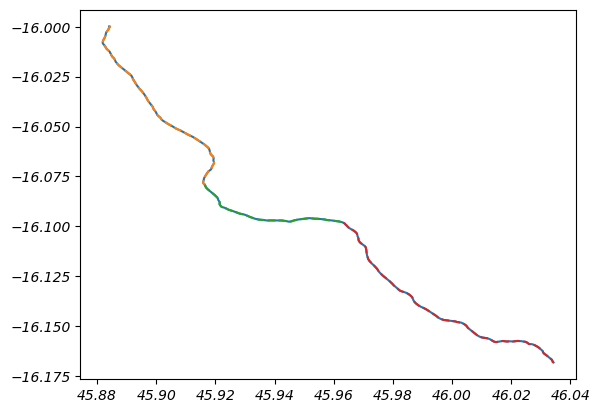

In [99]:
L
plt.plot(*L.xy)

for i, r in D.iterrows():
    plt.plot(*r['geometry'].xy, linestyle = '--')

In [39]:
import json
import ast
import re

In [40]:
 A = 'ABCDE'
re.sub('A|D', '', A)

'BCE'

In [37]:
replacements = {
    'cat': 'dog',
    'hello': 'hi',
    'blue': 'red'
}

pattern = re.compile("|".join(map(re.escape, replacements)))
pattern

re.compile(r'cat|hello|blue', re.UNICODE)

In [49]:
a = [1,2,3]
b = [4,5,6]
c = np.empty(2, dtype = object)
c[0] = a
c[1] = b
c = np.array2string(c, separator= ',')

In [50]:
# A = np.array()
# print(A)
# A = A.replace('(', '').replace(')', '')
re.sub('[()]|list', '', c)

'[[1, 2, 3],[4, 5, 6]]'

In [36]:
ast.literal_eval(df.iloc[0].elevInn)
json.loads(A)

[[0.5,
  0.5,
  2.8499997,
  2.8499997,
  2.8499997,
  2.8499997,
  2.8499997,
  2.8499997,
  2.78,
  2.78,
  2.78,
  2.78,
  2.82,
  2.82,
  2.83,
  2.823333,
  2.82,
  2.82,
  2.82,
  2.8100002,
  2.8166666,
  2.82,
  2.82,
  2.8,
  2.8,
  2.8,
  2.8066666,
  2.8,
  2.8,
  2.8,
  2.7933333,
  2.79,
  2.7933333,
  2.7966664,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8,
  2.8066666,
  2.8066666,
  2.8066666,
  2.8033333,
  2.8100002,
  2.8100002,
  2.8100002,
  2.8100002,
  2.8133335,
  2.8166666,
  2.82,
  2.82,
  2.82,
  2.82,
  2.823333,
  2.8333333,
  2.84,
  2.84,
  2.8366668,
  2.8333333,
  2.8333333,
  2.8366668,
  2.8366668,
  2.83,
  2.83,
  2.83,
  2.82,
  2.8066666,
  2.8066666,
  2.8,
  2.82,
  2.83,
  2.8466666,
  2.8633335,
  2.0866668,
  1.2933334,
  0.5,
  0.5,
  1.29,
  1.29,
  2.08,
  2.08,
  2.88,
  2.88,
  2.86,
  2.8666668,
  2.89,
  2.89,
  2.88,
  2.87,
  2.8766668,
  2.8766668,
  2.9133332,
  2.9166667,

In [8]:
for i, f in tqdm(enumerate(allFiles[22:28]), total = len(allFiles)):
    dfTemp = pd.read_csv(f, dtype = {'calculated': str, 'include_flag':str})
    dfTemp['file_cont'] = f[-12:-10]
    dfTemp['file_id'] = f[-9:-7]
    if i == 0:
        df = dfTemp
    else:
        df = pd.concat([df, dfTemp], ignore_index = True)
df['file'] = df['file_cont'] + '_' + df['file_id']

 14%|█▍        | 6/43 [01:18<08:03, 13.08s/it]


In [ ]:
# create reach averaged values per continent
for c in ['as', 'af', 'sa', 'na', 'eu', 'oc']:
    findGrouopFiles = np.sort(glob.glob(directory + f'results/reach_averaged/{c}_??_25.gpkg'))
    for i, f in enumerate(findGrouopFiles):
        D = gpd.read_file(f)
        if i == 0:
            d = D
        else:
            d = pd.concat([d, D])
    d.to_file(directory + f'results/reach_averaged/{c}.gpkg')


## check missing rows

In [118]:
dfCheck = df[df['include_flag'] == '0']
dfCheck.shape[0], dfCheck['include_flag'].unique(),df.shape[0]

(17913, array(['0'], dtype=object), 21441)

In [120]:
dfCheck['calculated'].unique()

array(['000', '011'], dtype=object)

In [121]:
dfCheck[dfCheck['calculated'] == '011'].shape[0]

58

In [39]:
dfCheck.loc[(dfCheck['calculated'] == '011') & (dfCheck['file'] == 'af_00'), 'combined_reach_id'].values

NameError: name 'dfCheck' is not defined

In [43]:
df[df['bendMaxWidths'] > 1e3].shape[0] / df.shape[0] *100

3.6333865974455453

# check not created files

In [98]:
# file_sorting
dfFS = pd.read_csv(directory + 'results/file_sorting.csv')
# dfFS[dfFS.file.str.startswith('af')]

In [99]:
dfFS[dfFS['file'].str.startswith('af')]

,Unnamed: 0,file,filePath,size
15,1,af_01,/scratch/6256481/results/new_segments/vector/a...,4635
22,2,af_02,/scratch/6256481/results/new_segments/vector/a...,4178
25,0,af_00,/scratch/6256481/results/new_segments/vector/a...,4083
29,3,af_03,/scratch/6256481/results/new_segments/vector/a...,3981
42,4,af_04,/scratch/6256481/results/new_segments/vector/a...,1036


In [158]:
allFileNames = [f[-12:-7] for f in allFiles]
for i, r in dfFS.iterrows():
    if r['file'] not in allFileNames:
        print(r['file'])

sa_01
as_04
na_05
as_05
as_06
eu_02
na_00
na_01


# Analyzing

## Open Files

### Open files new created

In [8]:
files = glob(directory + f'results/single_values/{'af'}*50*conf.nc')
files

['/scratch/6256481/results/single_values/af_04_50_conf.nc',
 '/scratch/6256481/results/single_values/af_02_50_conf.nc',
 '/scratch/6256481/results/single_values/af_00_50_conf.nc',
 '/scratch/6256481/results/single_values/af_03_50_conf.nc',
 '/scratch/6256481/results/single_values/af_01_50_conf.nc']

In [2]:
dsList = []
cross = 50
for c in ['af', 'as', 'sa', 'na', 'oc', 'eu']:
# for c in ['sa']:
    print(c)
    files = glob(directory + f'results/single_values/{c}*{cross}*conf.nc')
    for f in tqdm(files):
        dsTemp = xr.open_dataset(f)
        dsTemp['file'] = ('index', [c] * dsTemp.sizes['index'])
        dsTemp = dsTemp.drop_vars(['infP', 'bendLines', 'apexP', 'lineInn', 'lineOut'])
        dsList.append(dsTemp)
    
ds = xr.concat(dsList, dim='index')
fName = directory + f'results/single_values/global_{cross}_conf.nc'
if os.path.exists(fName):
    os.remove(fName)
ds.to_netcdf(fName)

af


100%|██████████| 5/5 [01:15<00:00, 15.19s/it]


as


100%|██████████| 17/17 [05:05<00:00, 17.96s/it]


sa


100%|██████████| 5/5 [05:26<00:00, 65.24s/it] 


na


100%|██████████| 7/7 [01:20<00:00, 11.57s/it]


oc


100%|██████████| 3/3 [00:31<00:00, 10.47s/it]


eu


100%|██████████| 6/6 [01:08<00:00, 11.33s/it]


### Open global netcdf

In [17]:
f = directory + 'results/single_values/global_50_conf.nc'
ds = xr.open_dataset(f)

## Extract vars from ds

In [30]:
ds

<xarray.Dataset> Size: 3GB
Dimensions:                   (index: 1727926)
Coordinates:
  * index                     (index) int64 14MB 0 1 2 3 ... 51137 51138 51139
Data variables: (12/86)
    Unnamed: 0                (index) int64 14MB ...
    combined_reach_id         (index) float64 14MB 1.271e+04 ... 1.563e+04
    reach_id                  (index) int64 14MB 18170600411 ... 26181000635
    reach_len                 (index) float64 14MB ...
    n_nodes                   (index) int64 14MB ...
    wse                       (index) float64 14MB ...
    ...                        ...
    slope_right               (index) float64 14MB 0.03762 0.02294 ... 0.0006319
    ER_max                    (index) float64 14MB ...
    ER_min                    (index) float64 14MB ...
    slope_max                 (index) float64 14MB ...
    slope_min                 (index) float64 14MB ...
    file                      (index) <U2 14MB 'af' 'af' 'af' ... 'eu' 'eu' 'eu'

In [85]:
dsSubset = ds[['ER_inn', 'ER_out', 'slope_inn', 'slope_out',
    'ER_left', 'ER_right', 'slope_left', 'slope_right',
    'apex', 'catchment_position', 'bendWidths', 'bendMaxWidths',
    'cp_height','bendDistOut','max_dist_out','bendHeight',
    'sin', 'ang', 'conFactor', 'catchment_position', 'combined_reach_id', 'combined_reach_len', 'reach_id', 'file', 'bendLen', 'up_reach_id']]
df = dsSubset.to_dataframe().reset_index()

In [86]:
df[df['reach_id'] == 18140100161]['up_reach_id'].iloc[0]

18140100196.0

In [92]:
df['ER_max']    = df[['ER_inn', 'ER_out']].max(axis = 1)
df['slope_max'] = df[['slope_inn', 'slope_out']].max(axis = 1)


df['slope_diff_bendSide']     = df['slope_inn']     - df['slope_out']
df['slope_diff_bendSide_abs'] = abs(df['slope_inn'] - df['slope_out'])
df['slope_diff_side']         = df['slope_left']    - df['slope_right']


df['ER_diff_bendSide']     = df['ER_inn']     - df['ER_out']
df['ER_diff_bendSide_abs'] = abs(df['ER_inn'] - df['ER_out'])
df['ER_diff_side']         = df['ER_left']    - df['ER_right']

# df['slope_out_angle']   = ((df['conFactor']*2*df['bendWidths'])/(0.5*df['bendMaxWidths'])) * df['slope_out']
# df['slope_inn_angle']   = ((df['conFactor']*2*df['bendWidths'])/(0.5*df['bendMaxWidths'])) * df['slope_inn']
# df['slope_left_angle']  = ((df['conFactor']*2*df['bendWidths'])/(0.5*df['bendMaxWidths'])) * df['slope_left']
# df['slope_right_angle'] = ((df['conFactor']*2*df['bendWidths'])/(0.5*df['bendMaxWidths'])) * df['slope_right']

# df['slope_diff_bendSide_angle']     = df['slope_inn_angle']     - df['slope_out_angle']
# df['slope_max_angle'] = df[['slope_inn_angle', 'slope_out_angle']].max(axis = 1)

df['nonDimAmp'] = df['apex'] / df['bendMaxWidths']

df['catch_height'] = df['bendHeight'] * df['catchment_position']




df['bend_catch_pos'] = df['bendDistOut'] / df['max_dist_out']

dfG = df.groupby('combined_reach_id', as_index = False)[['combined_reach_len', 'sin']].first()

In [62]:
A = df[(~df['ER_out'].isna()) | (~df['ER_inn'].isna())]
A.bendLen.sum() / df.bendLen.sum(), A.shape[0] / df.shape[0]

(0.8738254264919497, 0.8797332756148122)

In [47]:
df.shape[0]

1727926

## Plot settings

In [46]:
labelTextSize = 20
tickSize      = 15
scatterAlpha  = 0.05
scatterSize   = 0.1

## Histograms

In [22]:
def log_scaled_histogram(data, dataCols, rows, cols, xlab, ylab, title, save, labelTextSize,
                         sharex = True, sharey = False, bins = 200):

    f, ax = plt.subplots(nrows = rows, ncols = cols, figsize  = [12,8], sharex = sharex, sharey= sharey,
                          squeeze = False)

    for r in range(rows):
        for c in range(cols):
            x = data[dataCols[r+c]]
            if x.min() <= 0:
                x = x[x > 0]
            bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)

            # Create histogram
            ax[r,c].hist(x, bins=bin_edges, alpha=0.7)
            ax[r,c].set_xscale('log')
            ax[r,c].set_yscale('log')
            if c == 0:
                ax[r,c].set_ylabel(ylab[c], fontsize = labelTextSize)
            if r == (rows-1):
                ax[r,c].set_xlabel(xlab[c], fontsize = labelTextSize)
            

    f.suptitle(title)
    plt.tight_layout()
    plt.savefig(directory + f'results/figures/{save}.png')
    plt.show()

### Reach len

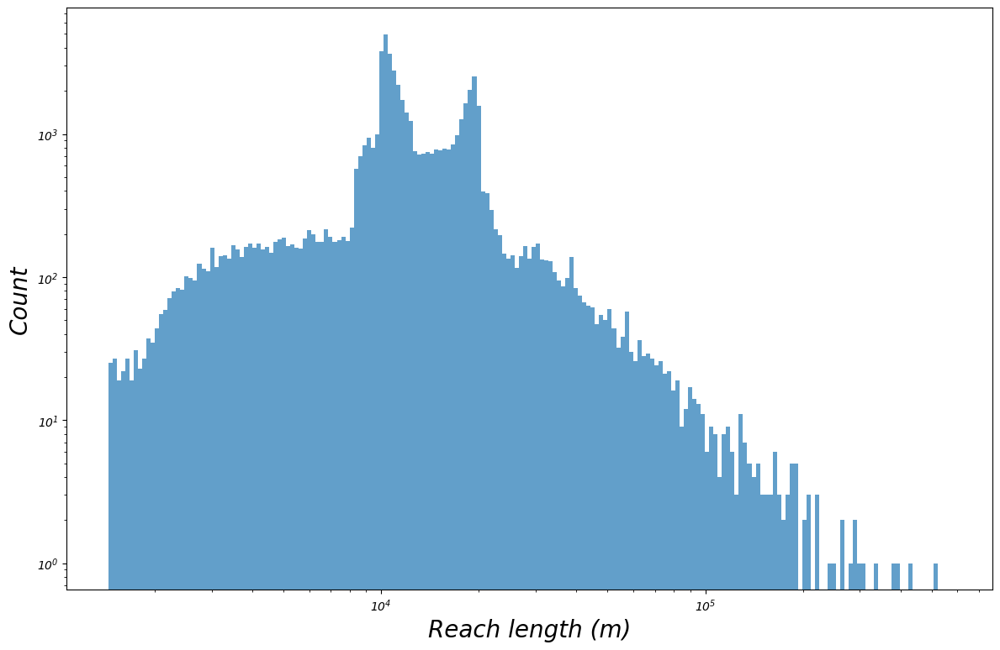

In [23]:

log_scaled_histogram(dfG, ['combined_reach_len'], 1, 1,
                     ['Reach length (m)'], ['Count'], 
                      '', 'hist_reach_len', labelTextSize)

### bendWidth / bendMaxwidth

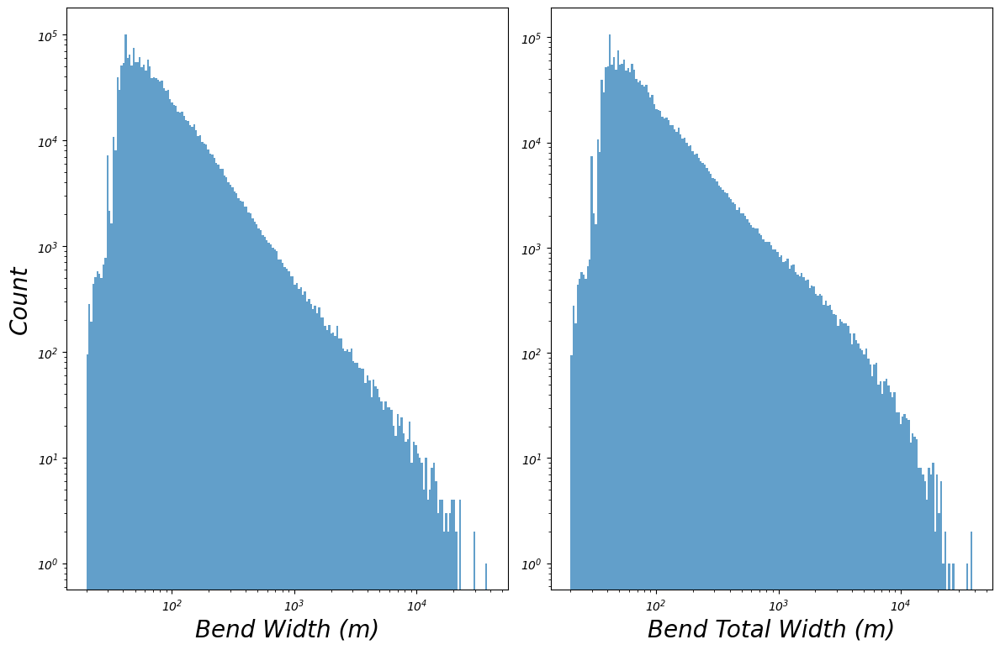

In [24]:
log_scaled_histogram(df, ['bendWidths', 'bendMaxWidths'], 1, 2,
                     ['Bend Width (m)', 'Bend Total Width (m)'], ['Count'], 
                      '', 'hist_bendWidths', labelTextSize)


### Sinuosity / curve ang

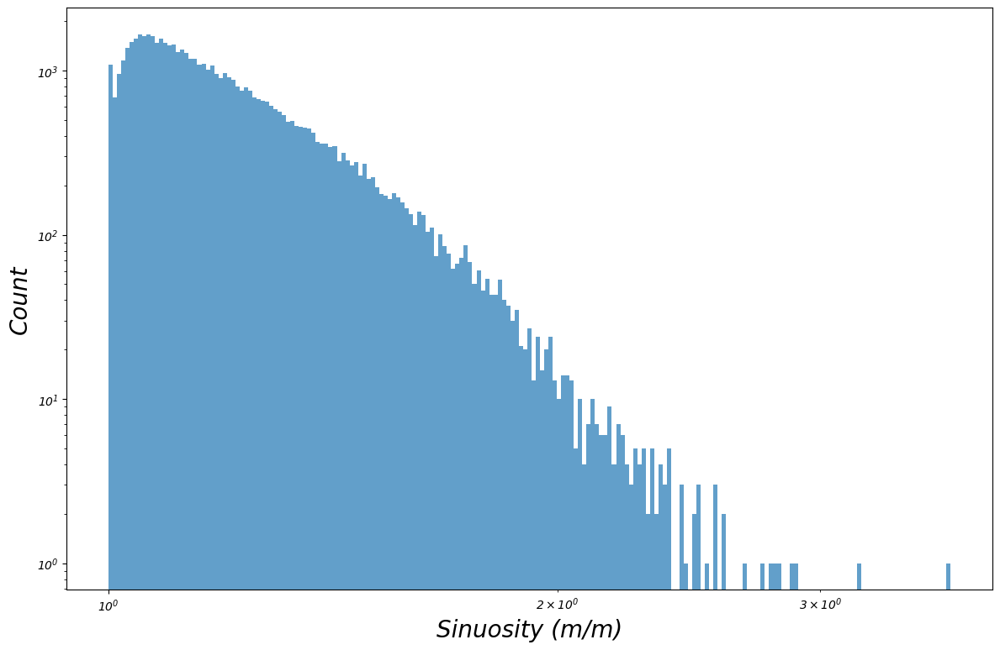

In [25]:
log_scaled_histogram(dfG, ['sin'], 1, 1,
                     ['Sinuosity (m/m)'], ['Count'], 
                      '', 'hist_sin', labelTextSize)



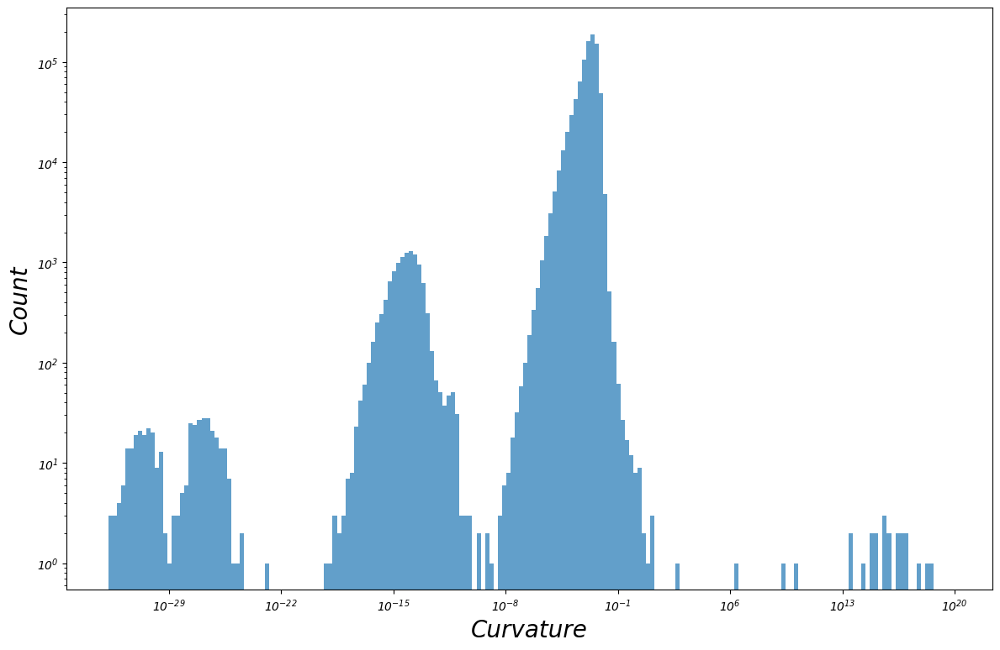

In [26]:
log_scaled_histogram(df, ['ang'], 1, 1,
                     ['Curvature'], ['Count'], 
                      '', 'hist_ang', labelTextSize)


### Apex / apex vs bendWidth

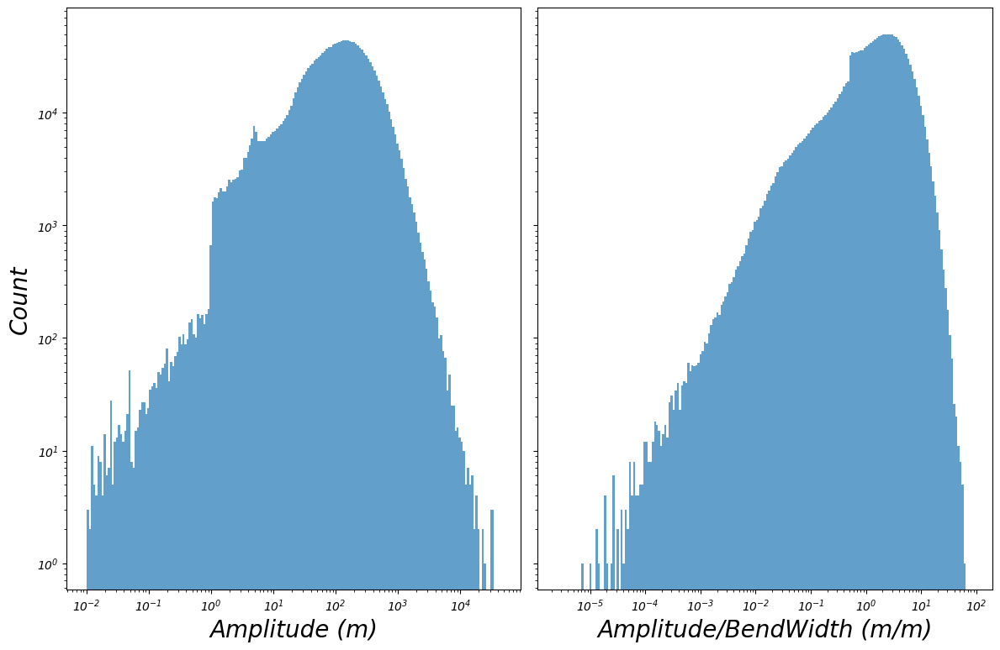

In [27]:
log_scaled_histogram(df[df['apex']>0.01], ['apex', 'nonDimAmp'], 1, 2,
                     ['Amplitude (m)', 'Amplitude/BendWidth (m/m)'], ['Count'], 
                      '', 'hist_ampBendWidth', labelTextSize, False, True)


### Catchment Position

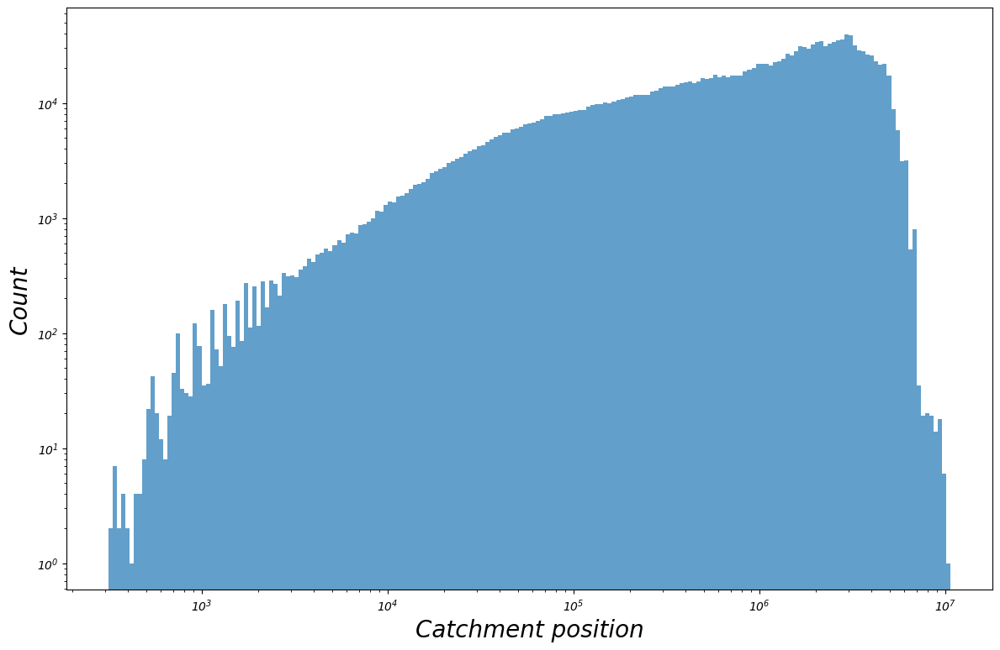

In [28]:

log_scaled_histogram(df, ['bendDistOut'], 1, 1,
                     ['Catchment position'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

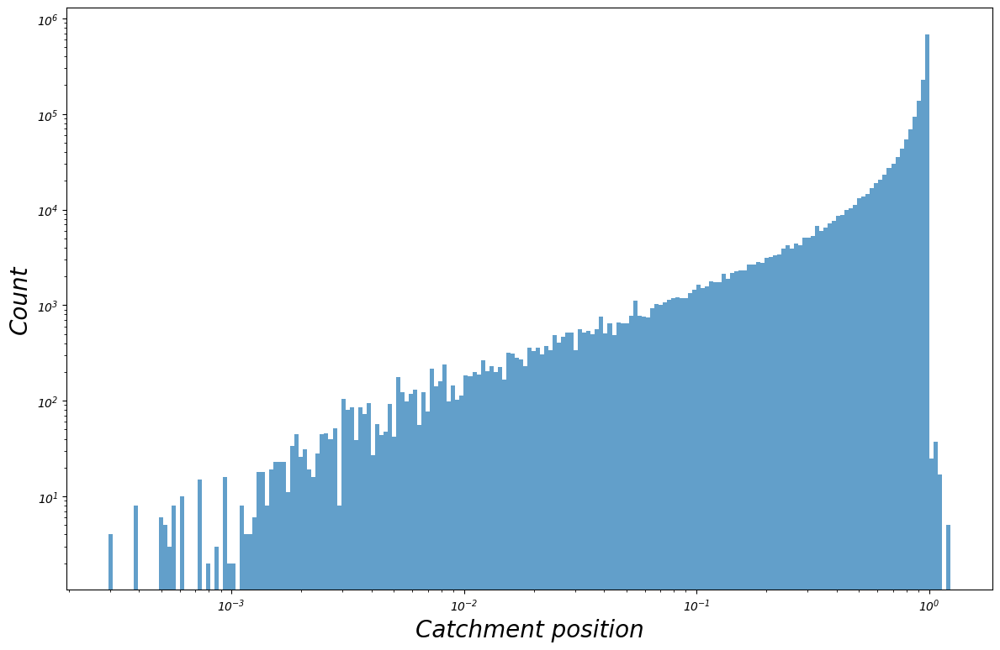

In [29]:

log_scaled_histogram(df, ['catchment_position'], 1, 1,
                     ['Catchment position'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

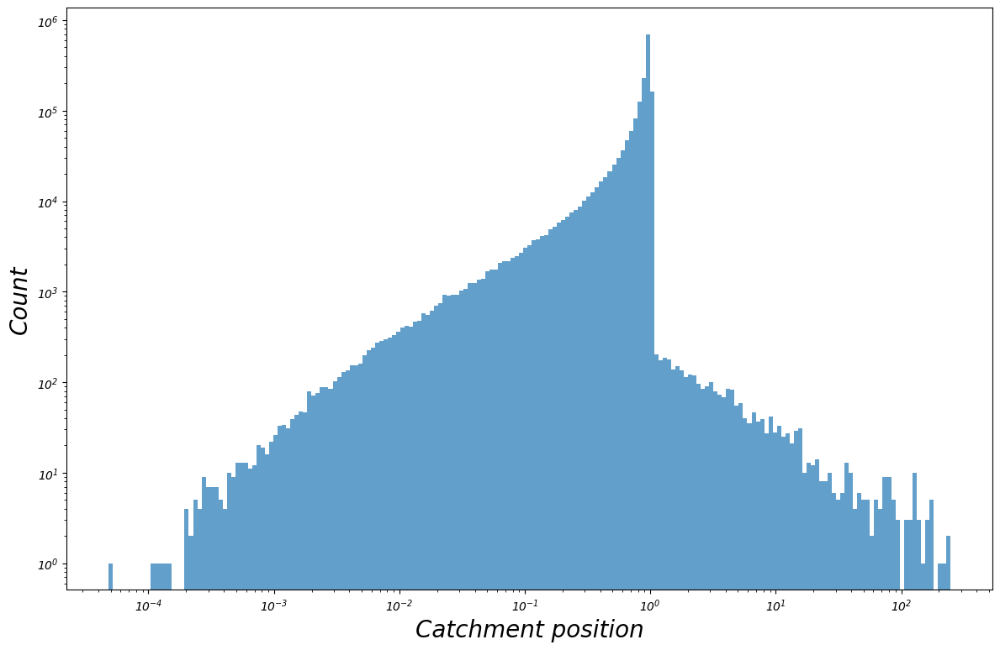

In [31]:
log_scaled_histogram(df, ['bend_catch_pos'], 1, 1,
                     ['Catchment position'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize)

### Elevation

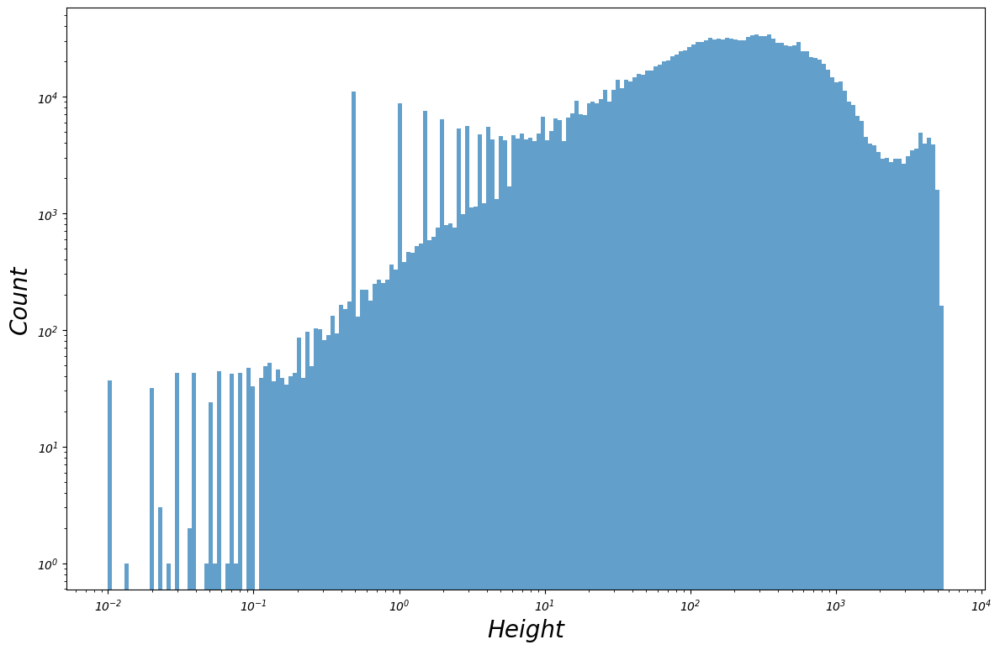

In [32]:
log_scaled_histogram(df, ['cp_height'], 1, 1,
                     ['Height'], ['Count'], 
                      '', 'catchmentPos_hist', labelTextSize, 50)

### confinement Ratio

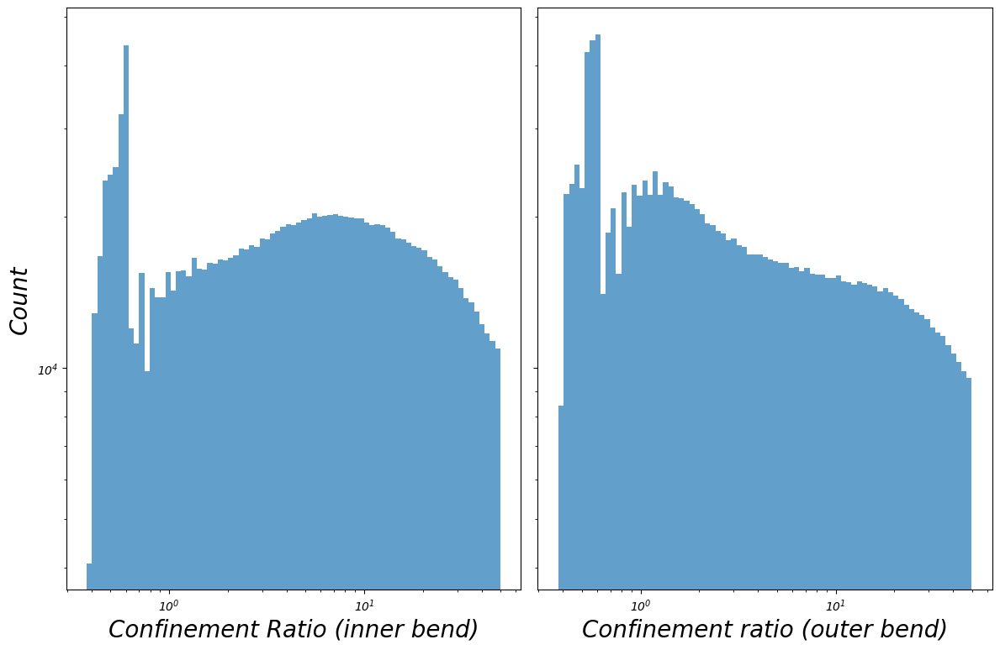

In [33]:
log_scaled_histogram(df, ['ER_inn', 'ER_out'], 1, 2,
                     ['Confinement Ratio (inner bend)', 'Confinement ratio (outer bend)'], ['Count'], 
                      '', 'hist_ER_outinn', labelTextSize, True, True, 80)

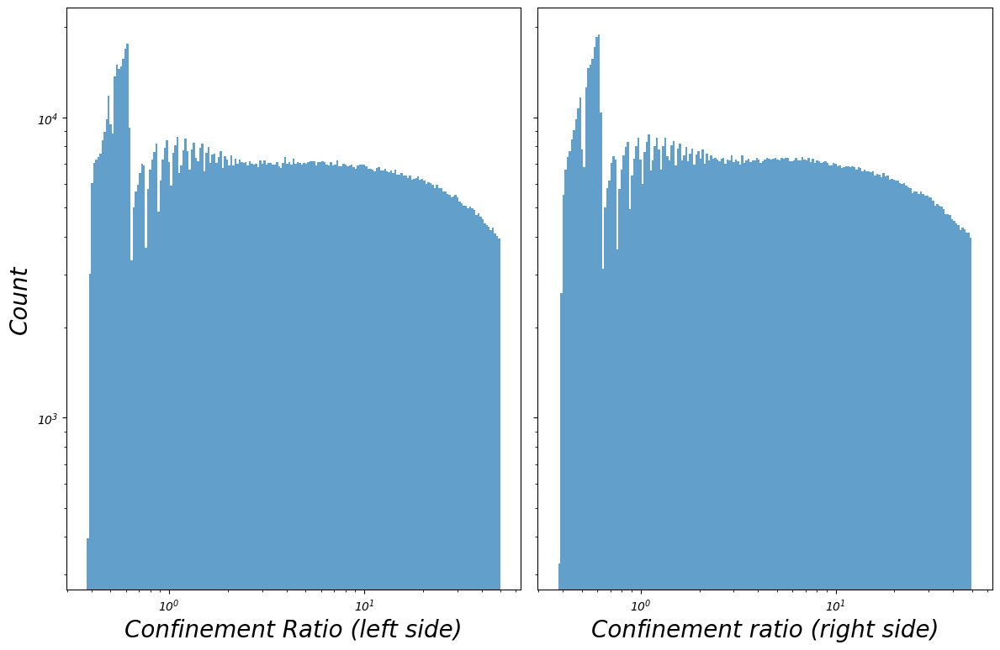

In [34]:
log_scaled_histogram(df, ['ER_left', 'ER_right'], 1, 2,
                     ['Confinement Ratio (left side)', 'Confinement ratio (right side)'], ['Count'], 
                      '', 'hist_ER_leftright', labelTextSize, True, True)

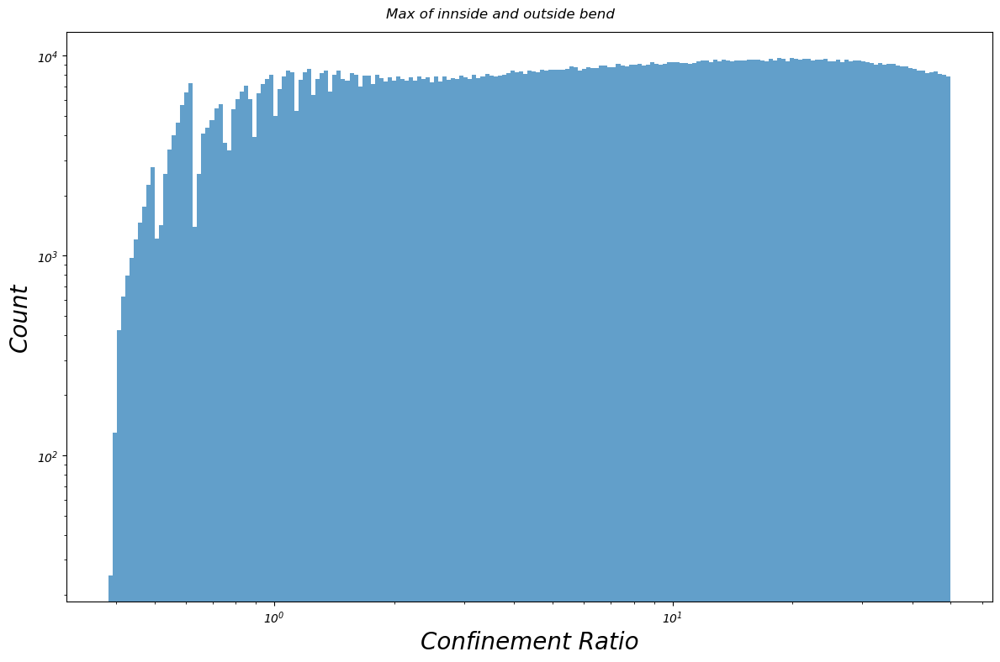

In [35]:
log_scaled_histogram(df, ['ER_max'], 1, 1,
                     ['Confinement Ratio'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

### Confinement slope

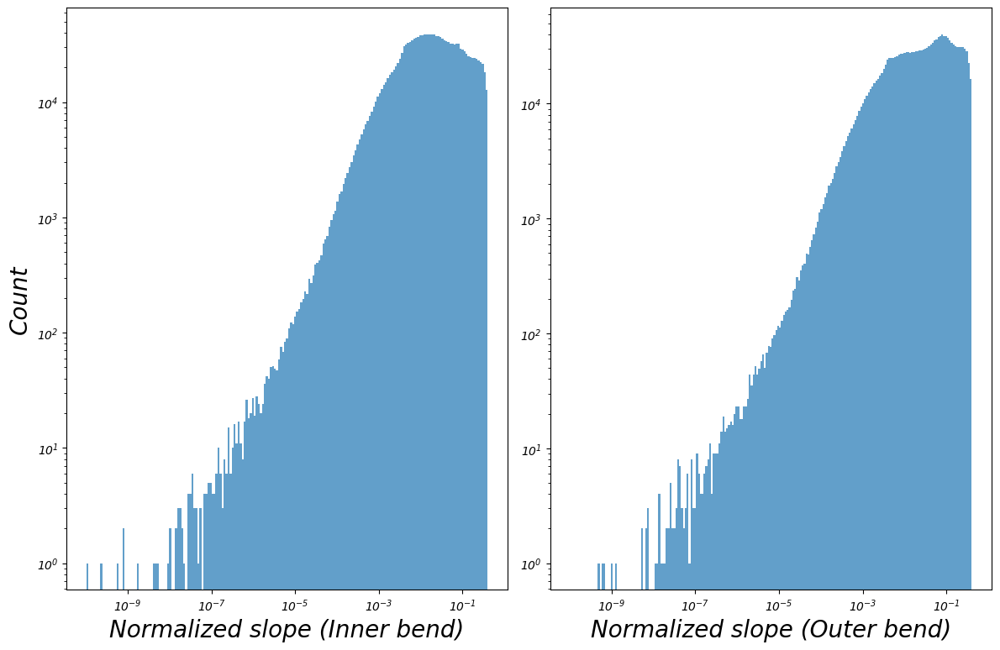

In [36]:
log_scaled_histogram(df, ['slope_inn', 'slope_out'], 1, 2,
                     ['Normalized slope (Inner bend)', 'Normalized slope (Outer bend)'], ['Count'], 
                      '', 'hist_normSlope_outinn', labelTextSize)

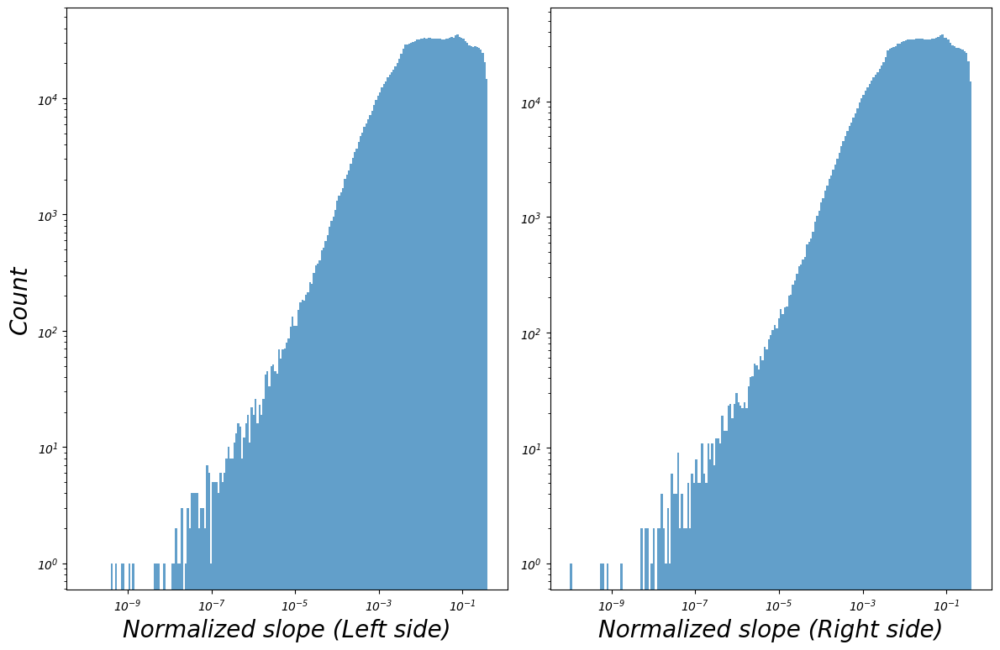

In [37]:
log_scaled_histogram(df, ['slope_left', 'slope_right'], 1, 2,
                     ['Normalized slope (Left side)', 'Normalized slope (Right side)'], ['Count'], 
                      '', 'hist_normSlope_outinn', labelTextSize)

findfont: Font family ['DejaVu Sans Display'] not found. Falling back to DejaVu Sans.


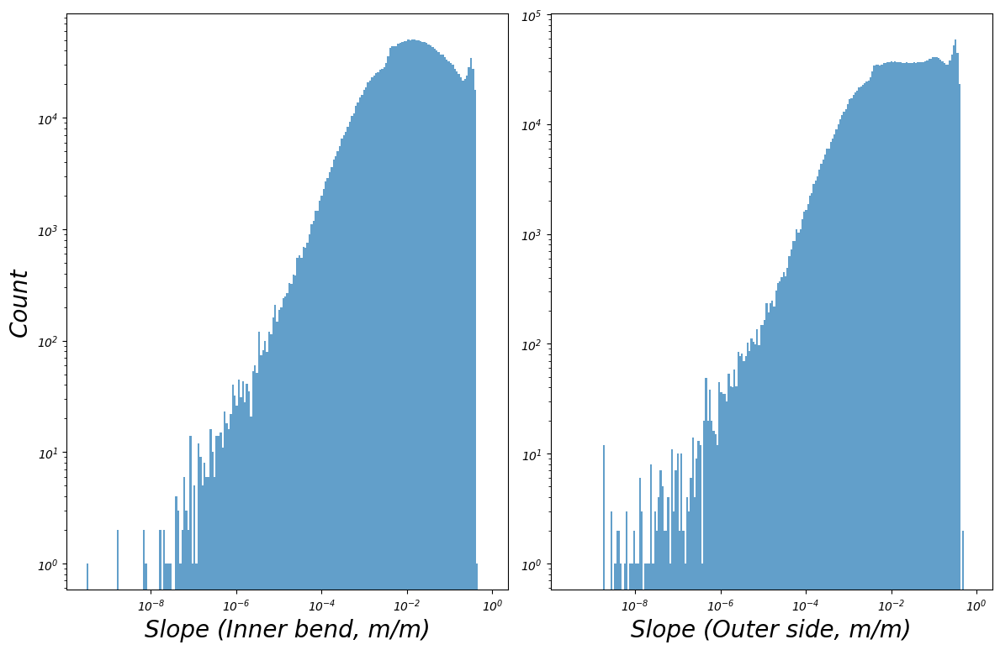

In [ ]:
log_scaled_histogram(df, ['slope_inn_angle', 'slope_out_angle'], 1, 2,
                     ['Slope (Inner bend, m/m)', 'Slope (Outer side, m/m)'], ['Count'], 
                      '', 'hist_angleSlope_outinn', labelTextSize)

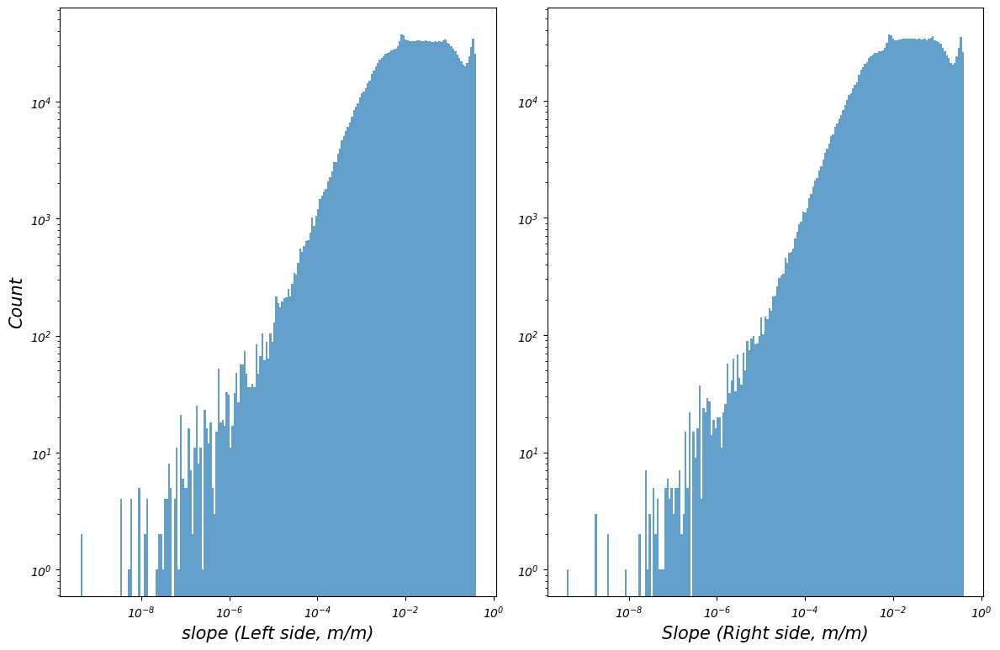

In [ ]:
log_scaled_histogram(df, ['slope_left_angle', 'slope_right_angle'], 1, 2,
                     ['slope (Left side, m/m)', 'Slope (Right side, m/m)'], ['Count'], 
                      '', 'hist_angleSlope_leftright', labelTextSize)

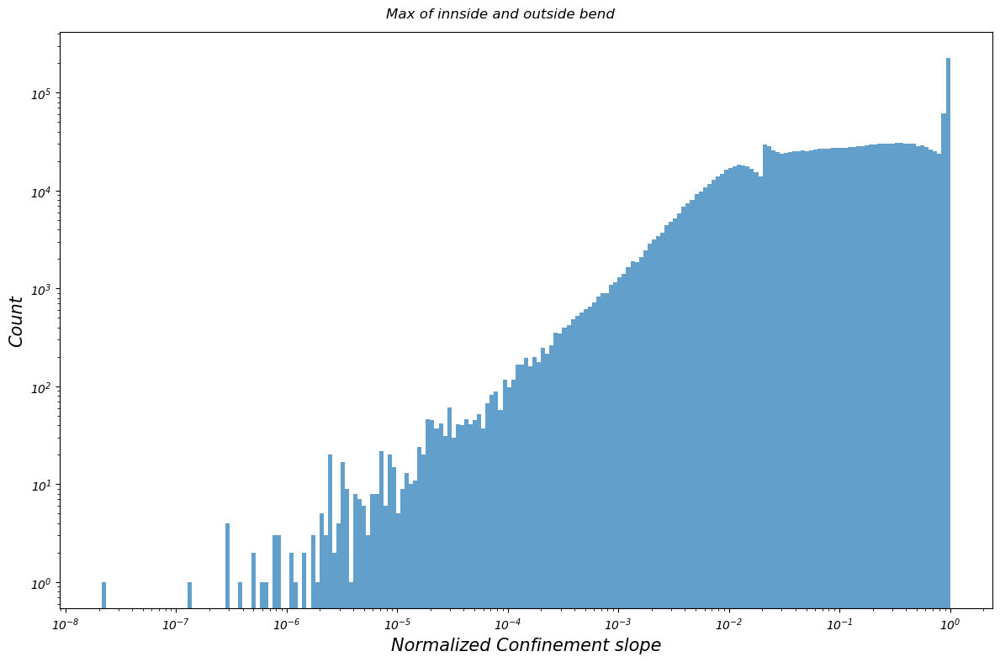

In [ ]:
log_scaled_histogram(df, ['slope_max'], 1, 1,
                     ['Normalized Confinement slope'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

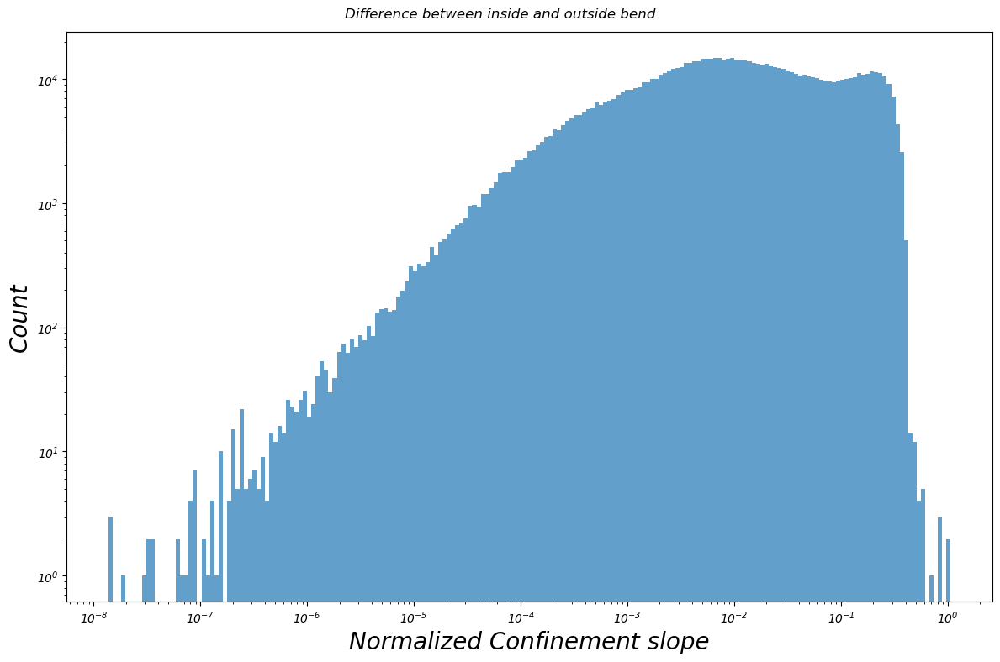

In [ ]:
log_scaled_histogram(df, ['slope_diff_bendSide_angle'], 1, 1,
                     ['Normalized Confinement slope'], ['Count'], 
                      'Difference between inside and outside bend', '', labelTextSize)

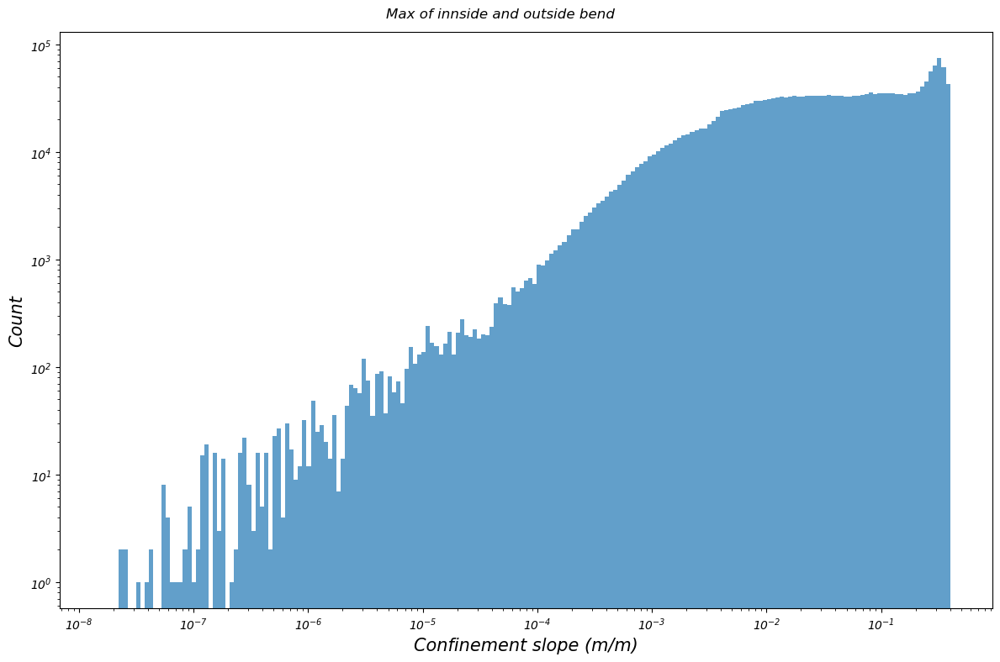

In [ ]:
log_scaled_histogram(df, ['slope_max_angle'], 1, 1,
                     ['Confinement slope (m/m)'], ['Count'], 
                      'Max of innside and outside bend', '', labelTextSize)

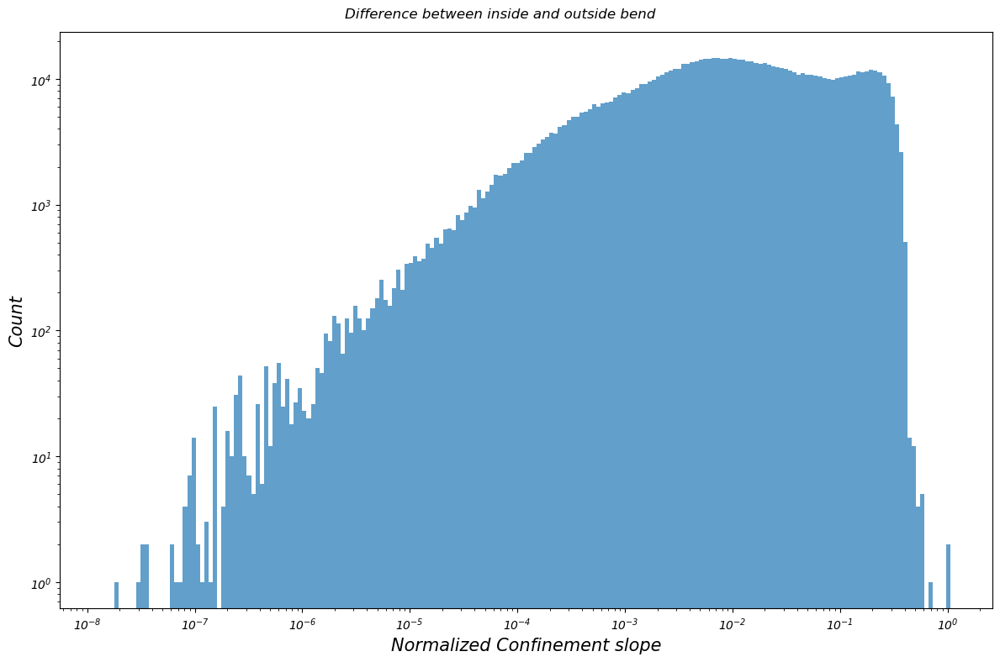

In [ ]:
log_scaled_histogram(df, ['slope_diff_bendSide_angle'], 1, 1,
                     ['Confinement slope (m/m)'], ['Count'], 
                      'Difference between inside and outside bend', '', labelTextSize)

### Confinement slope adjusted

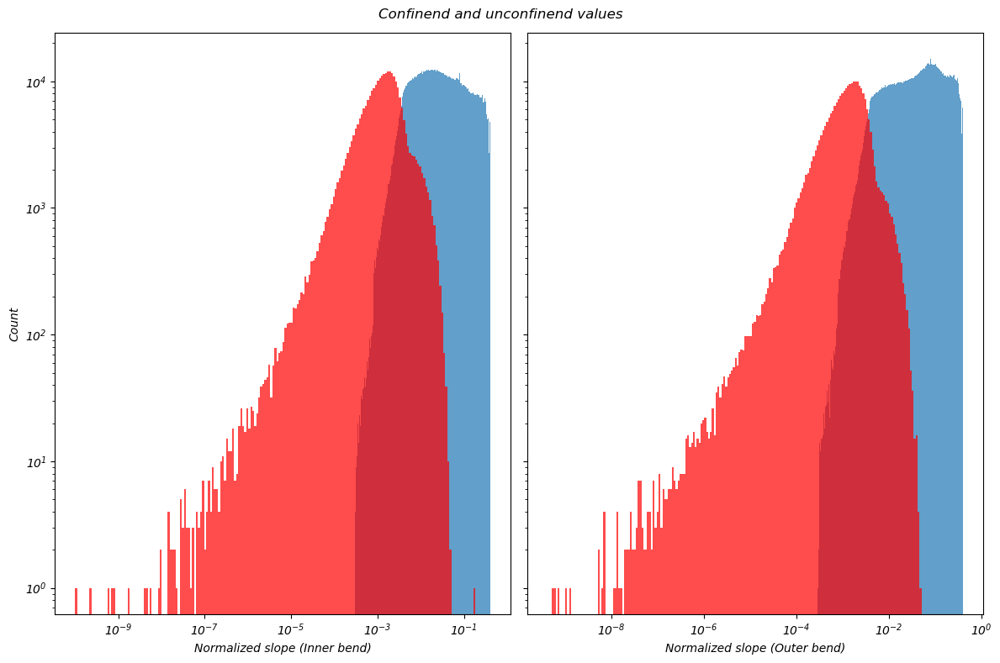

In [38]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)

##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out']
if x.min() <= 0:
    x = x[x > 0]

bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
# ax[0,1].vlines(0.75,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
# ax[0,1].vlines(0.5 ,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].set_yscale('log')
ax[0,1].set_xscale('log')

ax[0,0].set_xlabel('Normalized slope (Inner bend)')
ax[0,1].set_xlabel('Normalized slope (Outer bend)')
ax[0,0].set_ylabel('Count')



f.suptitle('Confinend and unconfinend values')
plt.tight_layout()
plt.show()

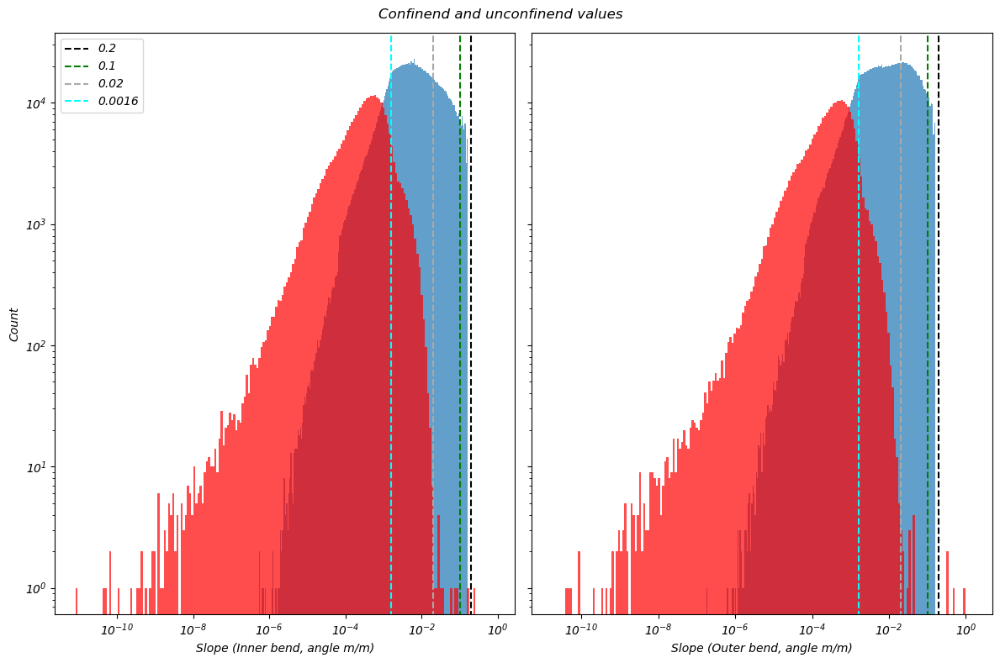

In [39]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)

##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,0].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out_angle']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out_angle']
if x.min() <= 0:
    x = x[x > 0]

bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=200)
ax[0,1].hist(x, bins=bin_edges, alpha=0.7, color = 'red')
# ax[0,1].vlines(0.75,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
# ax[0,1].vlines(0.5 ,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].set_yscale('log')
ax[0,1].set_xscale('log')

ax[0,0].set_xlabel('Slope (Inner bend, angle m/m)')
ax[0,1].set_xlabel('Slope (Outer bend, angle m/m)')
ax[0,0].set_ylabel('Count')

l1, color = 0.2,'black'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.1,'green'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.02,'darkgray'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)

l1, color = 0.0016,'cyan'
ax[0,0].vlines(l1, 0, 10e4, linestyle = '--', color = color, label = l1)
ax[0,1].vlines(l1, 0, 10e4, linestyle = '--', color = color)
ax[0,0].legend()
f.suptitle('Confinend and unconfinend values')
plt.tight_layout()
plt.show()

In [ ]:
df['slope_out_T'] = df['slope_out'].copy()
df.loc[df['slope_out_T'] <0, 'slope_out_T'] = (df['slope_out_T']*-1) + 1

df['slope_inn_T'] = df['slope_inn'].copy()
df.loc[df['slope_inn_T'] < 0, 'slope_inn_T'] = (df['slope_inn_T']*-1) + 1

# check rows with to high negative value

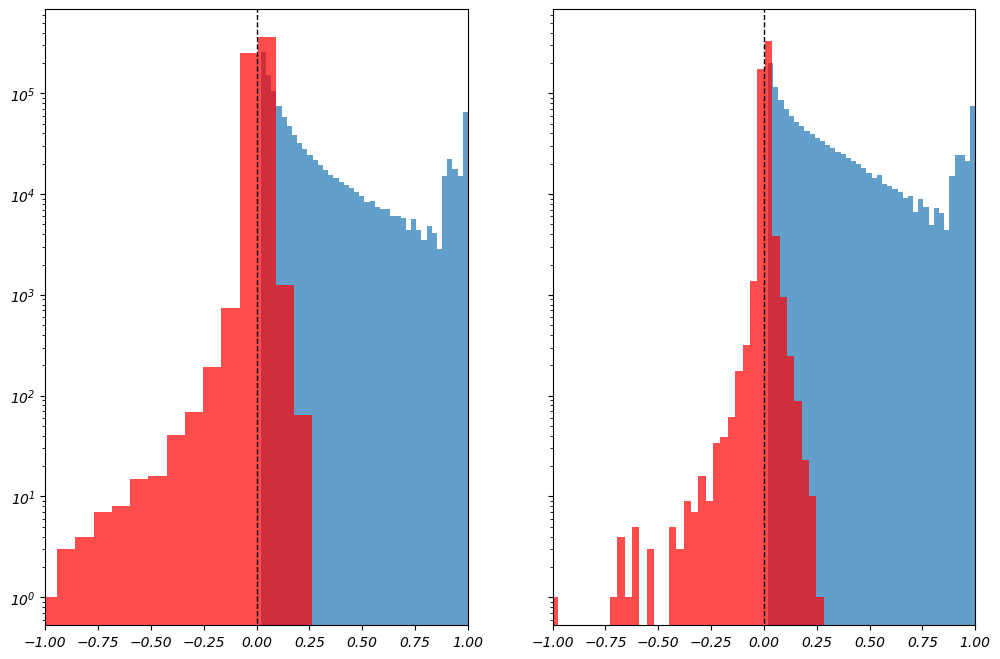

In [ ]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize  = [12,8], sharex = True, sharey= True,
                        squeeze = False)
bins = 40
##############
# innside bend
x = df.loc[~df['ER_inn'].isna(), 'slope_inn']

ax[0,0].hist(x, bins=bins, alpha=0.7)

x = df.loc[df['ER_inn'].isna(), 'slope_inn']

ax[0,0].hist(x, bins=bins, alpha=0.7, color = 'red')
ax[0,0].set_yscale('log')

##############
# Outside bend
x = df.loc[~df['ER_out'].isna(), 'slope_out']

ax[0,1].hist(x, bins=bins, alpha=0.7)

x = df.loc[df['ER_out'].isna(), 'slope_out']

ax[0,1].hist(x, bins=bins, alpha=0.7, color = 'red')
ax[0,1].set_yscale('log')
ax[0,1].set_xlim(-1,1)
ax[0,0].vlines(0,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
ax[0,1].vlines(0,0, 10e5, linewidth = 1, linestyle = '--', color = 'black')
plt.show()

In [ ]:
import seaborn as sns

# Define conditions
conditions = [
    (~df['ER_out'].isna()) & (~df['ER_inn'].isna()),  # High
    (df['ER_out'].isna()) & (df['ER_inn'].isna()),
    (df['ER_out'].isna()) | (df['ER_inn'].isna())  # Medium
      # Low
]

# Define corresponding values
choices = ['Both', 'Single', 'No']

# Apply CASE WHEN logic
df['Confinement'] = np.select(conditions, choices, default='Unknown')


# Transform data while keeping sign
col  = 'slope_diff_bendSide'
data = df[[col, 'Confinement']].copy()

data['log'] = np.sign(data[col]) * np.log10(np.abs(data[col]))

# Plot histogram


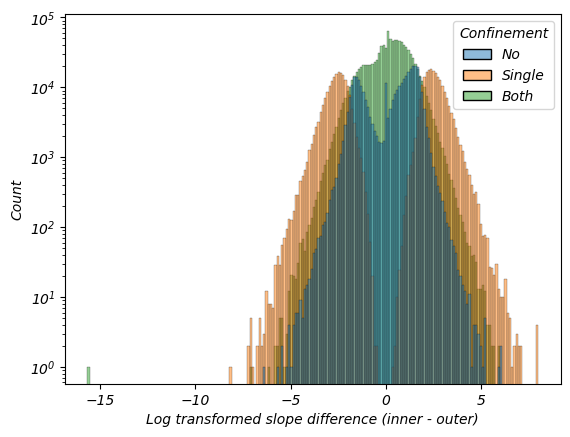

In [ ]:
sns.histplot(data = data, x = 'log', hue = 'Confinement', bins=200, kde=False)
plt.xlabel("Log transformed slope difference (inner - outer)")
plt.ylabel("Count")
plt.title("")
plt.yscale('log')
plt.show()


## EGU

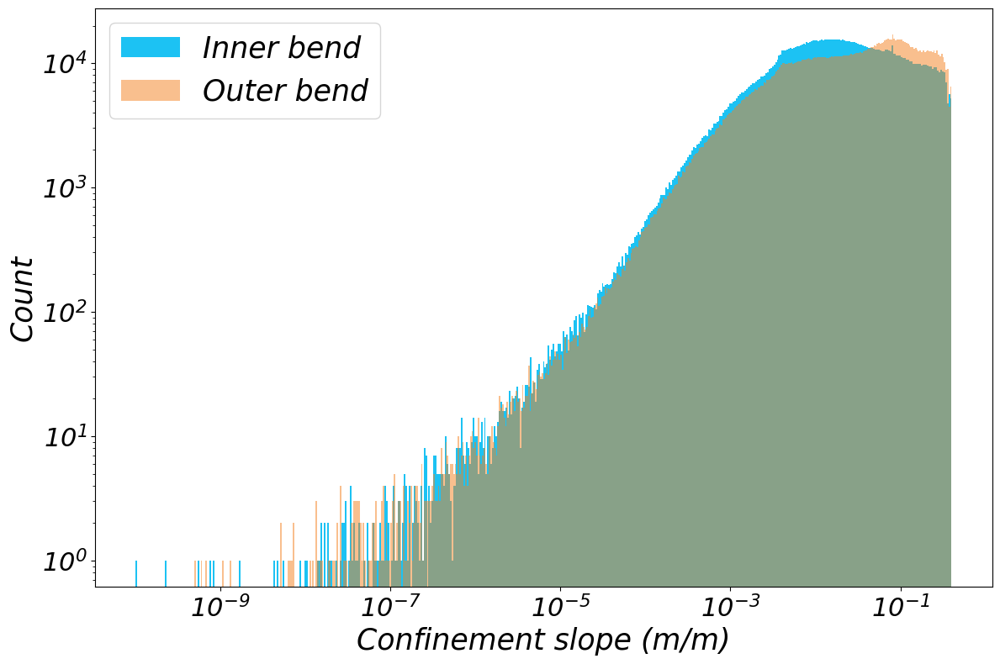

In [55]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)
bins = 500
##############
# innside bend
norm = ''
x = df[f'slope_inn{norm}']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=1, color = '#1CC2F3', label = 'Inner bend')

x = df[f'slope_out{norm}']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=0.5, color = '#F5811E', label = 'Outer bend')

ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')


ax[0,0].set_xlabel('Confinement slope (m/m)', fontsize = labelTextSize)
ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
ax[0,0].tick_params(axis='both', labelsize=tickSize)
ax[0,0].legend(fontsize = labelTextSize)

plt.tight_layout()
plt.show()

In [53]:
labelTextSize = 25
tickSize = 22

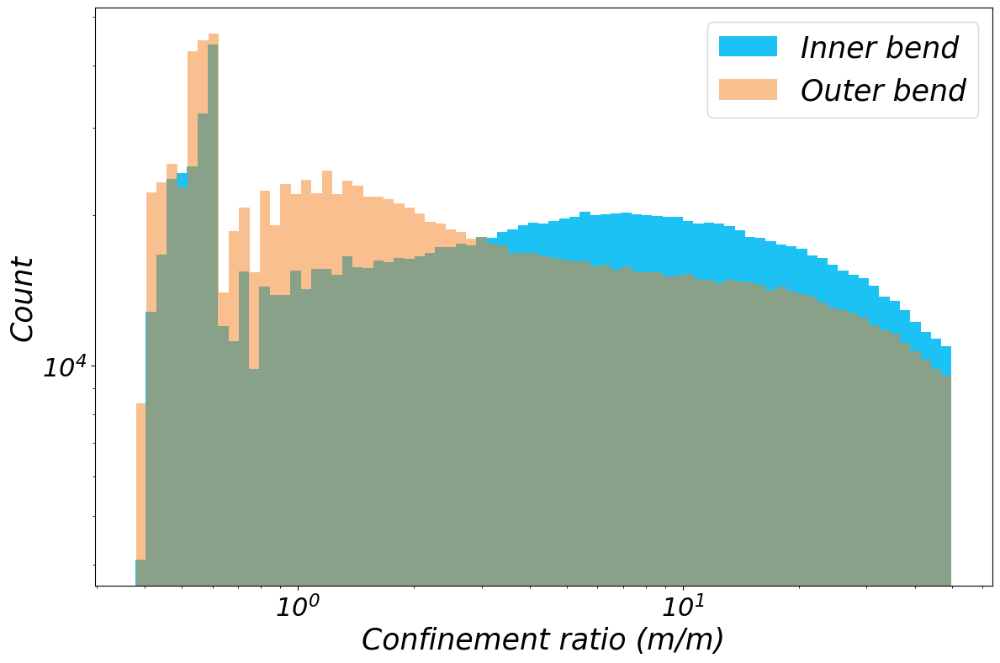

In [54]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = False, sharey= True,
                        squeeze = False)
bins = 80
##############
# innside bend
norm = '_angle'
x = df[f'ER_inn']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=1, color = '#1CC2F3', label = 'Inner bend')

x = df[f'ER_out']
if x.min() <= 0:
    x = x[x > 0]
bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)
ax[0,0].hist(x, bins=bin_edges, alpha=0.5, color = '#F5811E', label = 'Outer bend')

ax[0,0].set_yscale('log')
ax[0,0].set_xscale('log')


ax[0,0].set_xlabel('Confinement ratio (m/m)', fontsize = labelTextSize)
ax[0,0].tick_params(axis='both', labelsize=tickSize)

ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
ax[0,0].legend(fontsize = labelTextSize)

plt.tight_layout()
plt.show()

In [34]:
df[~df['ER_out'].isna()]['slope_out'].min(), df[df['ER_inn'].isna()]['slope_inn'].max()

(0.0003044303984806301, 0.06315100575681158)

bendWidth
OUT


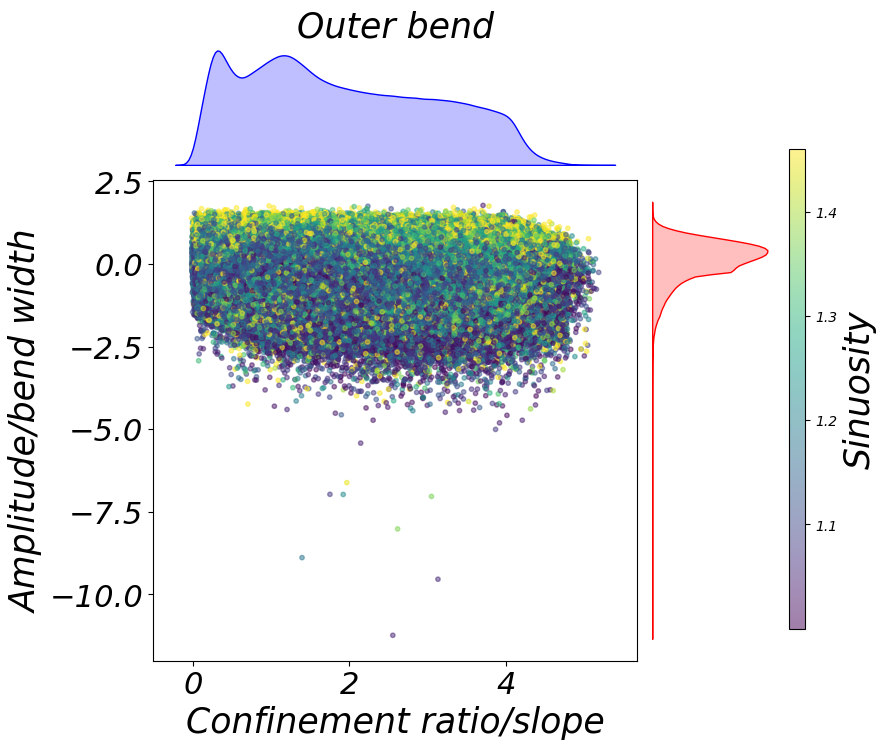

inn


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec

def scatter_density(df, colx, coly, colh, labx, laby, labh, title):

    dfT = df[[colx, coly, colh]].copy(deep = True)
    dfT = dfT[(~dfT[colx].isna()) & (dfT[coly] > 0)]
    dfT[f'log_{colx}'] = np.log10(dfT[colx])
    dfT[f'log_{coly}'] = np.log10(dfT[coly])
    # Example continuous variable for hue (e.g., size)

    dfT.loc[dfT[colh] > dfT[colh].quantile(0.9), colh] = dfT[colh].quantile(0.9)

    # Set up grid layout like jointplot
    fig = plt.figure(figsize=(8, 8))
    gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                        wspace=0.05, hspace=0.05)

    # Main scatter plot
    ax_main = fig.add_subplot(gs[1, 0])
    scatter = ax_main.scatter(
        dfT[f'log_{colx}'],
        dfT[f'log_{coly}'],
        c=dfT[colh],
        cmap="viridis",
        alpha=0.5, s = 10
    )
    ax_main.set_xlabel(labx, fontsize = labelTextSize)
    ax_main.set_ylabel(laby, fontsize = labelTextSize)
    ax_main.tick_params(axis='both', labelsize=tickSize)

    # Marginal KDE (X)
    ax_kde_x = fig.add_subplot(gs[0, 0], sharex=ax_main)
    sns.kdeplot(x=dfT[f'log_{colx}'], ax=ax_kde_x, fill=True, color='blue')
    ax_kde_x.axis("off")
    ax_kde_x.set_title(title, fontsize = labelTextSize)
    
    # Marginal KDE (Y)
    ax_kde_y = fig.add_subplot(gs[1, 1], sharey=ax_main)
    sns.kdeplot(y=dfT[f'log_{coly}'], ax=ax_kde_y, fill=True, color='red')
    ax_kde_y.axis("off")
    
    # Colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.6])
    cbar = fig.colorbar(scatter, cax=cbar_ax)
    cbar.set_label(labh, fontsize = labelTextSize)
    

    plt.tight_layout()
    plt.show()
print('bendWidth')
# scatter_density(df, "ER_out", 'slope_out', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Outside bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Inside bend')
# scatter_density(df, "ER_out", 'slope_out', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Outside bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bendWidths','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend width (m)', 'Inside bend')

df['TOut'] = df['ER_out'] / df['slope_out']
df['TInn'] = df['ER_inn'] / df['slope_inn']
print('OUT')
# scatter_density(df, "TOut", 'bendHeight', 'sin'       ,'Confinement ratio/slope', 'Bend height (m)' , 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bendLen'   , 'sin'       ,'Confinement ratio/slope', 'Bend length (m)' , 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'sin'       , 'bendWidths','Confinement ratio/slope', 'Sinuosity'       , 'Bend widthth (m)', 'Outer bend')


scatter_density(df, "TOut", 'nonDimAmp'       , 'sin','Confinement ratio/slope', 'Amplitude/bend width', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bendWidths'      , 'sin','Confinement ratio/slope', 'Bend width (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TOut", 'bend_catch_pos'  , 'sin','Confinement ratio/slope', 'Relative catchment Position', 'Sinuosity', 'Outer bend')

print('inn')
# scatter_density(df, "TInn", 'bendHeight', 'sin'       ,'Confinement ratio/slope', 'Bend height (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TInn", 'bendLen'   , 'sin'       ,'Confinement ratio/slope', 'Bend length (m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "TInn", 'sin'       , 'bendWidths','Confinement ratio/slope', 'Sinuosity', 'Bend widthth (m)', 'Outer bend')


# scatter_density(df, "TInn", 'ang'           , 'sin','Confinement ratio/slope', 'Curvature', 'Sinuosity', 'Outer bend')
scatter_density(df, "TInn", 'nonDimAmp'             , 'sin','Confinement ratio/slope', 'Amplitude/bend width', 'Sinuosity', 'Inner bend')
# scatter_density(df, "TInn", 'bendWidths'    , 'sin','Confinement ratio/slope', 'Bend width (m)', 'Sinuosity', 'Inner bend')
# scatter_density(df, "TInn", 'bend_catch_pos', 'sin','Confinement ratio/slope', 'Relative catchment Position', 'Sinuosity', 'Outer bend')




# scatter_density(df, "ER_out", 'slope_out', 'nonDimAmp','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'nonDimAmp','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'cp_height','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend height (m)', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'cp_height','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Bend height (m)', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Sinuosity', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Sinuosity', 'Inside bend')

# scatter_density(df, "ER_out", 'slope_out', 'bend_catch_pos','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Relative catchment position', 'Outer bend')
# scatter_density(df, "ER_inn", 'slope_inn', 'bend_catch_pos','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Relative catchment position', 'Inside bend')

In [93]:
df.columns

Index(['index', 'ER_inn', 'ER_out', 'slope_inn', 'slope_out', 'ER_left',
       'ER_right', 'slope_left', 'slope_right', 'apex', 'catchment_position',
       'bendWidths', 'bendMaxWidths', 'cp_height', 'bendDistOut',
       'max_dist_out', 'bendHeight', 'sin', 'ang', 'conFactor',
       'combined_reach_id', 'combined_reach_len', 'reach_id', 'file',
       'bendLen', 'up_reach_id', 'T', 'ER_max', 'slope_max',
       'slope_diff_bendSide', 'slope_diff_bendSide_abs', 'slope_diff_side',
       'ER_diff_bendSide', 'ER_diff_bendSide_abs', 'ER_diff_side', 'nonDimAmp',
       'catch_height', 'bend_catch_pos'],
      dtype='object')

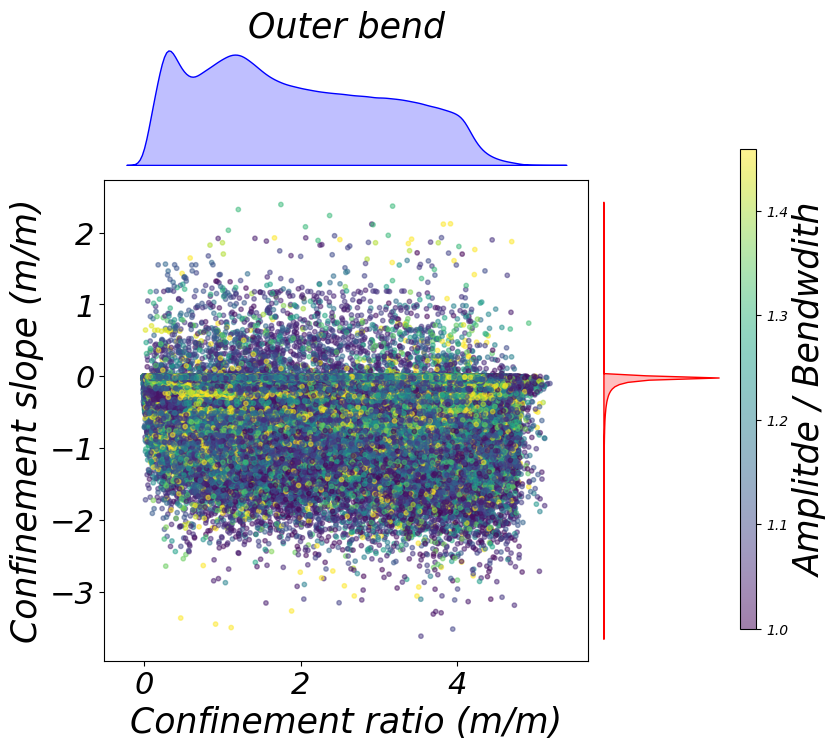

In [94]:
scatter_density(df, "T", 'bend_catch_pos', 'sin','Confinement ratio (m/m)', 'Confinement slope (m/m)', 'Amplitde / Bendwdith', 'Outer bend')


In [73]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec

cols = ['T', 'nonDimAmp', 'nonDimAmp']
dfT = df[cols].copy(deep = True)
# dfT = dfT[(~dfT[cols[0]].isna()) & (dfT[cols[1]] > 0)]
dfT = dfT[(~dfT[cols[0]].isna()) ]
dfT[f'log_{cols[1]}'] = np.log10(dfT[cols[1]])
dfT[f'log_{cols[0]}'] = np.log10(dfT[cols[0]])
# Example continuous variable for hue (e.g., size)
hue_var = cols[2]
dfT.loc[dfT[hue_var] > dfT[hue_var].quantile(0.9), hue_var] = dfT[hue_var].quantile(0.9)

# Set up grid layout like jointplot
fig = plt.figure(figsize=(8, 8))
gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[1, 4],
                       wspace=0.05, hspace=0.05)

# Main scatter plot
ax_main = fig.add_subplot(gs[1, 0])
scatter = ax_main.scatter(
    dfT[f'log_{cols[1]}'],
    dfT[f'log_{cols[0]}'],
    c=dfT[hue_var],
    cmap="viridis",
    alpha=0.5, s = 10
)
ax_main.set_xlabel("Confinement slope (m/m)")
ax_main.set_ylabel("Confinement ratio (m/m)")


# Marginal KDE (X)
ax_kde_x = fig.add_subplot(gs[0, 0], sharex=ax_main)
sns.kdeplot(x=dfT[f'log_{cols[1]}'], ax=ax_kde_x, fill=True, color='blue')
ax_kde_x.axis("off")

# Marginal KDE (Y)
ax_kde_y = fig.add_subplot(gs[1, 1], sharey=ax_main)
sns.kdeplot(y=dfT[f'log_{cols[0]}'], ax=ax_kde_y, fill=True, color='red')
ax_kde_y.axis("off")

# Colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.6])
cbar = fig.colorbar(scatter, cax=cbar_ax)
cbar.set_label(hue_var)

plt.tight_layout()
plt.show()


ValueError: Cannot set a DataFrame with multiple columns to the single column log_nonDimAmp

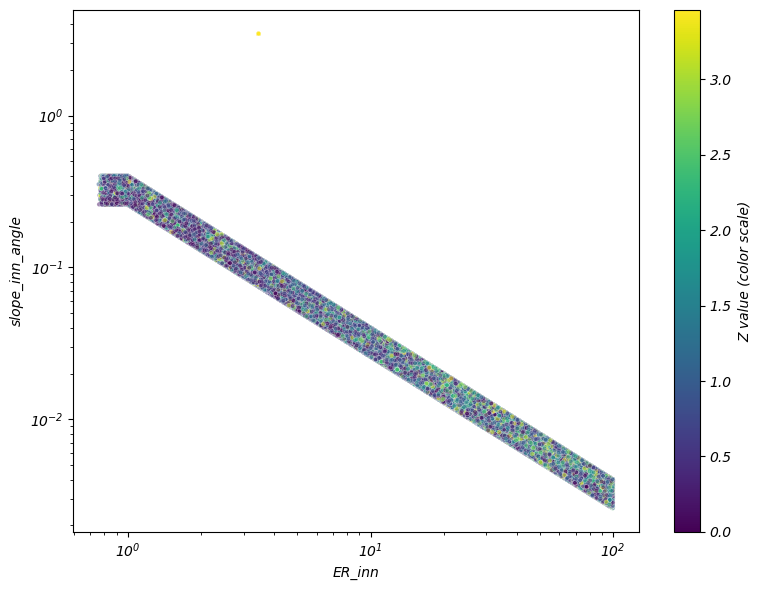

In [51]:
fig, ax = plt.subplots(figsize=(8, 6))
z = 'nonDimAmp'
df[f'{z}_scale'] = df[z].copy()
df[df[f'{z}_scale'] > df[f'{z}_scale'].quantile(0.8)] = df[f'{z}_scale'].quantile(0.80)

# Normalize color scale
norm = plt.Normalize(df[f'{z}_scale'].min(), df[f'{z}_scale'].max())
sm = plt.cm.ScalarMappable(cmap="viridis", norm=norm)
sm.set_array([])  # required dummy array

scatter = sns.scatterplot(df, x = 'ER_inn', y = 'slope_inn_angle', hue = 'nonDimAmp', legend = False, palette = 'viridis', ax = ax, alpha = 0.5, s = 10)
# plt.xlabel('Confinement ratio', fontsize = labelTextSize)
# plt.ylabel('Confinement slope', fontsize = labelTextSize)
# plt.title('Outer bend', fontsize = labelTextSize)
# plt.xticks(fontsize=tickSize)
# plt.yticks(fontsize=tickSize)

# Add colorbar (and now it knows which axis to attach to)
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Z value (color scale)")

# Add colorbar


plt.xscale('log')
plt.yscale('log')
plt.tight_layout()
plt.show()

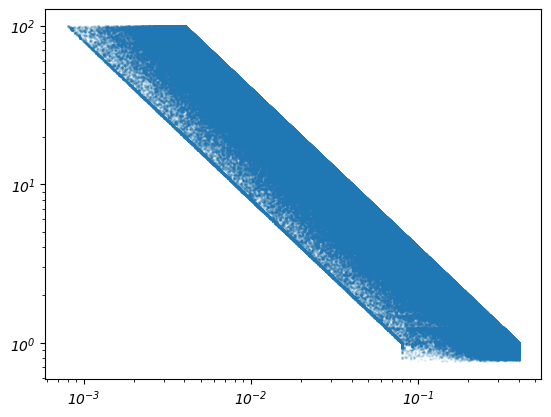

In [28]:
plt.scatter(df['slope_inn_angle'], df['ER_inn'], s = 1, alpha =0.05)
plt.xscale('log')
plt.yscale('log')

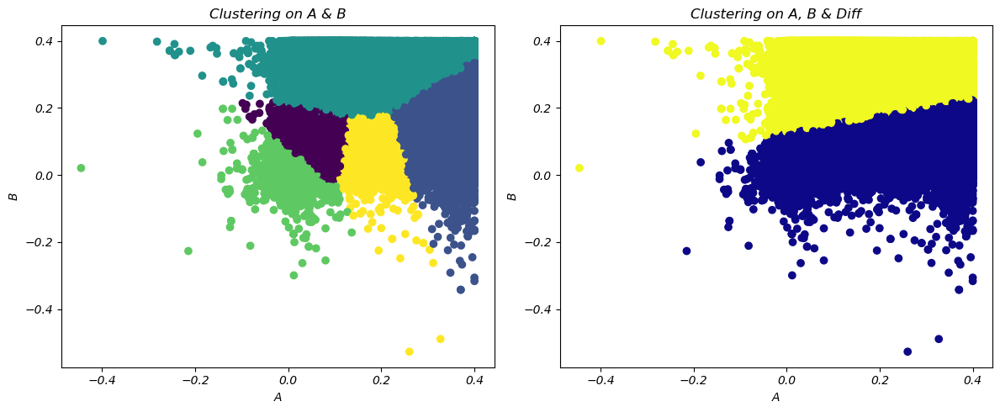

In [92]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Create a simple dataset
A = df.copy()
A = A[(~A['slope_out_angle'].isna()) & (~A['slope_inn_angle'].isna())]

# Option 1: Clustering using only A and B
kmeans_ab = KMeans(n_clusters=5, random_state=0)
A['cluster_AB'] = kmeans_ab.fit_predict(A[['slope_out_angle', 'slope_inn_angle']])

# Option 2: Clustering using A, B, and Diff
kmeans_abd = KMeans(n_clusters=2, random_state=0)
A['cluster_ABD'] = kmeans_abd.fit_predict(A[['slope_out_angle', 'slope_inn_angle', 'slope_diff_bendSide_angle']])

# Plot the results
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Clustering with A and B
axs[0].scatter(A['slope_out_angle'], A['slope_inn_angle'], c=A['cluster_AB'], cmap='viridis')
axs[0].set_title('Clustering on A & B')
axs[0].set_xlabel('A')
axs[0].set_ylabel('B')

# Clustering with A, B, and Diff
axs[1].scatter(A['slope_out_angle'], A['slope_inn_angle'], c=A['cluster_ABD'], cmap='plasma')
axs[1].set_title('Clustering on A, B & Diff')
axs[1].set_xlabel('A')
axs[1].set_ylabel('B')

plt.tight_layout()
plt.show()


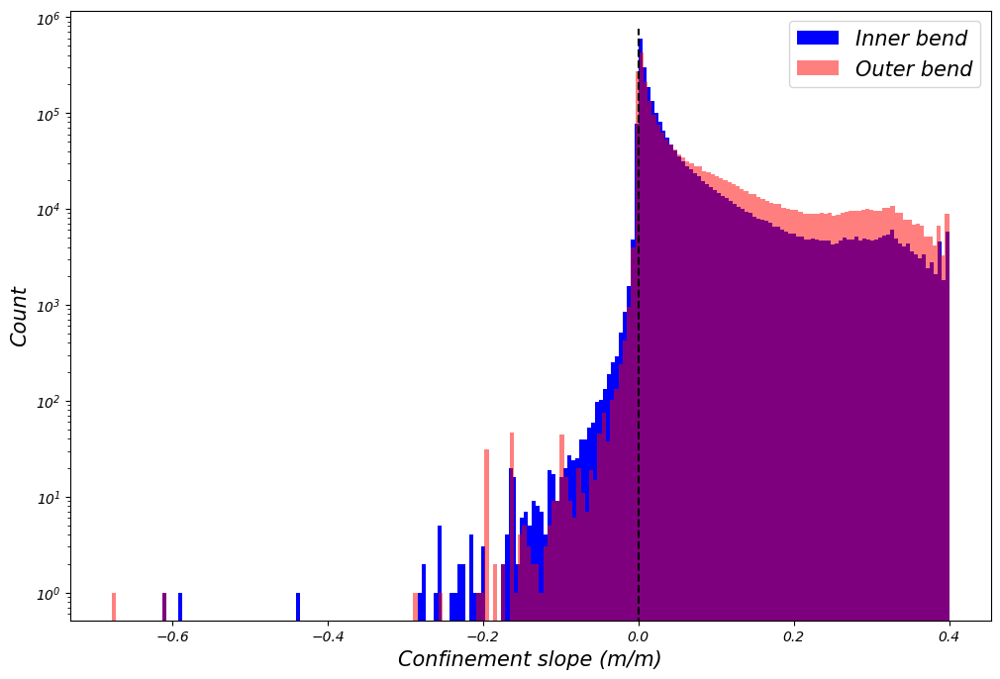

In [176]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize  = [12,8], sharex = True, sharey= True,
                        squeeze = False)
bins = 200
##############
# Outside bend
ax[0,0].hist(df['slope_inn_angle'], bins=bins, alpha=1, color = 'blue', label = 'Inner bend')
ax[0,0].hist(df['slope_out_angle'], bins=bins, alpha=0.5, color = 'red' , label = 'Outer bend')



ax[0,0].set_yscale('log')

ax[0,0].vlines(0,0, 15**5, linestyle = '--', color = 'black')
ax[0,0].set_xlabel('Confinement slope (m/m)', fontsize = labelTextSize)
ax[0,0].set_ylabel('Count', fontsize = labelTextSize)
plt.legend(fontsize = labelTextSize)
plt.show()

In [29]:
df[(df['slope_out'] < 0) & (df['slope_inn'] < 0)].shape[0] / df.shape[0], df[(df['slope_out'] < 0) & (df['slope_inn'] < 0)].shape[0]

(0.013770683243993134, 31367)

In [30]:
# df[(df['slope_out'] > 0.22) & (df['slope_inn'] > 0.22)].shape[0], df[(df['slope_out'] > 0.22) & (df['slope_inn'] > 0.22)].shape[0] / df.shape[0]

A = df[(df['slope_out_angle'] > 0.22) & (df['slope_inn_angle'] > 0.22)]

B = df[(df['ER_out'] < 2) & (df['ER_inn'] < 2)]
A['ER_out'].max(), A['ER_inn'].max(), B['slope_out_angle'].min(), B['slope_inn_angle'].min()
# df[(df['ER_out'] < 3.5) & (df['ER_inn'] < 2.5)].shape[0]

(1.8180529300654482,
 1.8181247759068642,
 0.04009871556579772,
 0.04003785450968866)

In [45]:
df[df['slope_out_angle'] == 0.04000954347997491]

,index,ER_inn,ER_out,slope_inn,slope_out,ER_left,ER_right,slope_left,slope_right,apex,...,slope_diff_bendSide_abs,slope_diff_side,ER_diff_bendSide,ER_diff_bendSide_abs,ER_diff_side,slope_out_angle,slope_inn_angle,slope_left_angle,slope_right_angle,nonDimAmp
1601369,13284,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261
1601393,13308,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261
1601395,13310,1.71994,1.999523,0.581416,0.500119,1.999523,1.71994,0.500119,0.581416,1381.842506,...,0.081296,-0.081296,-0.279583,0.279583,0.279583,0.04001,0.046513,0.04001,0.046513,0.979261


## Scatter plots

In [71]:
binSteps = [0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]


Q = bin_quantiles('slope_out_angle', ['slope_inn_angle'], binSteps)


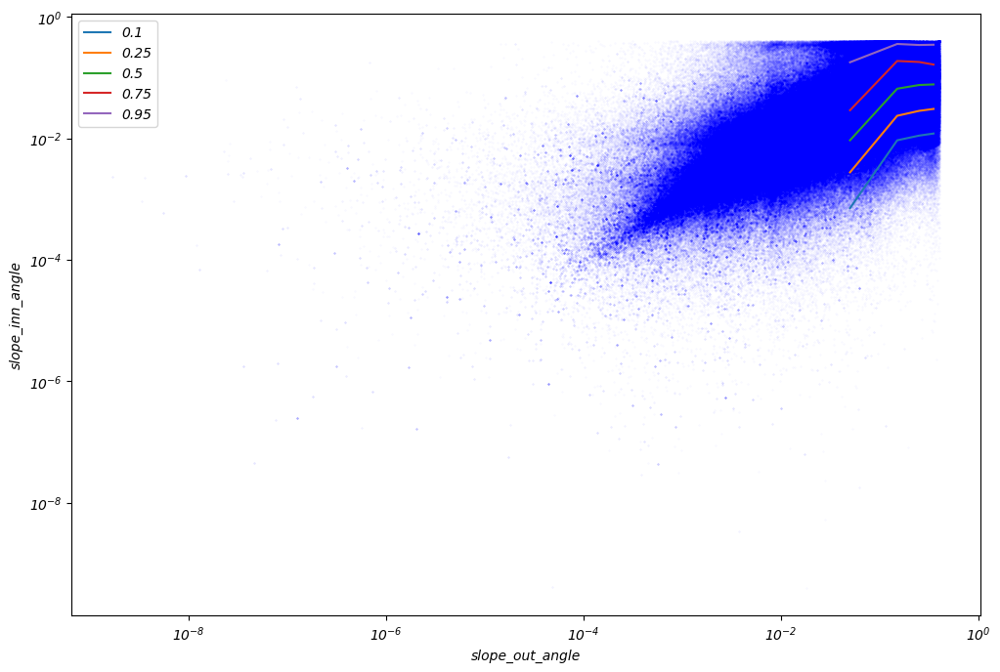

In [79]:
f, ax = plt.subplots(nrows = 1, ncols = 1, figsize = [12, 8], sharex = False, sharey = False, squeeze=False)

plot_apex_quant(df, 'slope_out_angle', 'slope_inn_angle', Q[0], ax[0,0])

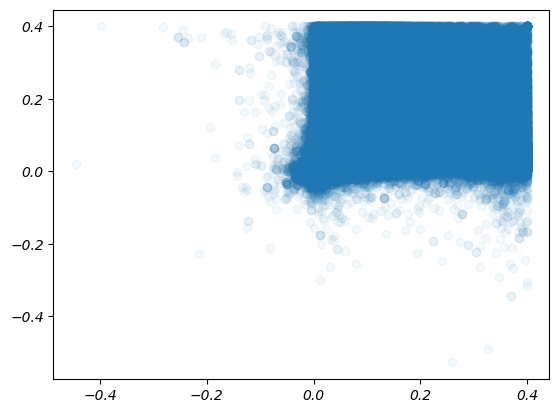

In [64]:
plt.scatter(df['slope_out_angle'], df['slope_inn_angle'], alpha = 0.05)


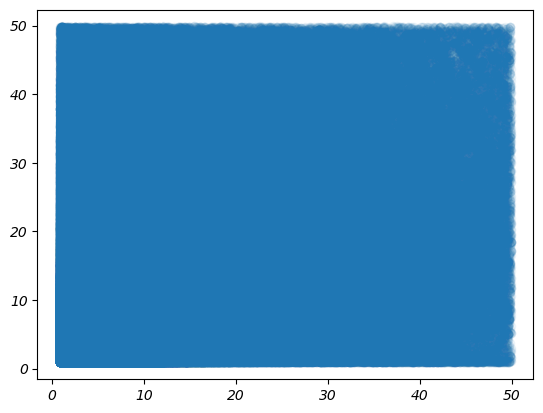

In [15]:

plt.scatter(df['ER_out'], df['ER_inn'], alpha = 0.05)

### bendWidth vs conf ratio

In [ ]:
def log_scaled_histogram(data, dataCols, rows, cols, xlab, ylab, title, save, labelTextSize,
                         sharex = True, sharey = False, bins = 200):

    f, ax = plt.subplots(nrows = rows, ncols = cols, figsize  = [12,8], sharex = sharex, sharey= sharey,
                          squeeze = False)

    for r in range(rows):
        for c in range(cols):
            x = data[dataCols[r+c]]
            if x.min() <= 0:
                x = x[x > 0]
            bin_edges = np.logspace(np.log10(x.min()), np.log10(x.max()), num=bins)

            # Create histogram
            ax[r,c].hist(x, bins=bin_edges, alpha=0.7)
            ax[r,c].set_xscale('log')
            ax[r,c].set_yscale('log')
            if c == 0:
                ax[r,c].set_ylabel(ylab[c], fontsize = labelTextSize)
            if r == (rows-1):
                ax[r,c].set_xlabel(xlab[c], fontsize = labelTextSize)
            

    f.suptitle(title)
    plt.tight_layout()
    plt.savefig(directory + f'results/figures/{save}.png')
    plt.show()

In [201]:
def scatter_plot(df,nrows, ncols, colX, colY, xlab, ylab,titles, sharex=True, sharey=False, alpha = 0.05):
    f, ax = plt.subplots(nrows = nrows, ncols = ncols, figsize = [12,8], sharex = sharex, sharey=sharey, squeeze = False)

    for r in range(nrows):
        for c in range(ncols):
            ax[r,c].scatter(df[colX[r]], df[colY[c]], s = 1, alpha = alpha)
            ax[r,c].set_xscale('log')
            ax[r,c].set_yscale('log')
            ax[r,c].set_title(titles[r+c]) 
            if c == 0:
                ax[r,c].set_ylabel(ylab[c], fontsize = labelTextSize)
            if r == (nrows-1):
                ax[r,c].set_xlabel(xlab[c], fontsize = labelTextSize)
    plt.tight_layout()
    plt.show()




### apex/bendWidth vs conf Slope

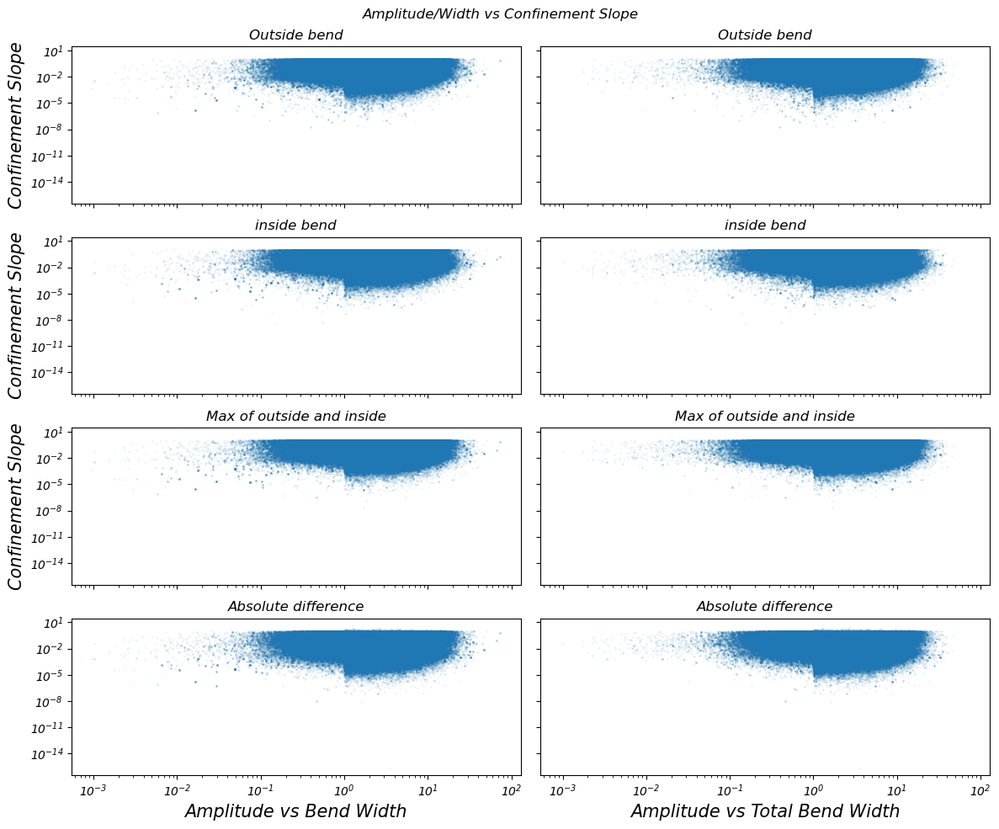

In [101]:
f, [ax1, ax2, ax3, ax4] = plt.subplots(nrows = 4, ncols = 2, figsize = [12,10], sharex = True, sharey=True)

ax1[0].scatter(apex/bendWidth, slopeOut, s = 1, alpha = scatterAlpha)
ax1[0].set_xscale('log')
ax1[0].set_yscale('log')
ax1[0].set_title('Outside bend')

ax1[1].scatter(apex/bendMaxWidth, slopeOut, s = 1, alpha = scatterAlpha)
ax1[1].set_xscale('log')
ax1[1].set_yscale('log')
ax1[1].set_title('Outside bend')

ax2[0].scatter(apex/bendWidth, slopeInn, s = 1, alpha = scatterAlpha)
ax2[0].set_xscale('log')
ax2[0].set_yscale('log')
ax2[0].set_title('inside bend')

ax2[1].scatter(apex/bendMaxWidth, slopeInn, s = 1, alpha = scatterAlpha)
ax2[1].set_xscale('log')
ax2[1].set_yscale('log')
ax2[1].set_title('inside bend')

ax3[0].scatter(apex/bendWidth, slopeMax, s = 1, alpha = scatterAlpha)
ax3[0].set_xscale('log')
ax3[0].set_yscale('log')
ax3[0].set_title('Max of outside and inside')

ax3[1].scatter(apex/bendMaxWidth, slopeMax, s = 1, alpha = scatterAlpha)
ax3[1].set_xscale('log')
ax3[1].set_yscale('log')
ax3[1].set_title('Max of outside and inside')

ax4[0].scatter(apex/bendWidth, abs(slopeInn - slopeOut), s = 1, alpha = scatterAlpha)
ax4[0].set_xscale('log')
ax4[0].set_yscale('log')
ax4[0].set_title('Absolute difference')

ax4[1].scatter(apex/bendMaxWidth, abs(slopeInn - slopeOut), s = 1, alpha = scatterAlpha)
ax4[1].set_xscale('log')
ax4[1].set_yscale('log')
ax4[1].set_title('Absolute difference')

ax1[0].set_ylabel('Confinement Slope', fontsize = labelTextSize)
ax2[0].set_ylabel('Confinement Slope', fontsize = labelTextSize)
ax3[0].set_ylabel('Confinement Slope', fontsize = labelTextSize)

ax4[0].set_xlabel('Amplitude vs Bend Width', fontsize = labelTextSize)
ax4[1].set_xlabel('Amplitude vs Total Bend Width', fontsize = labelTextSize)


plt.suptitle('Amplitude/Width vs Confinement Slope')
plt.tight_layout()
plt.show()

### catchment position vs conf Ratio

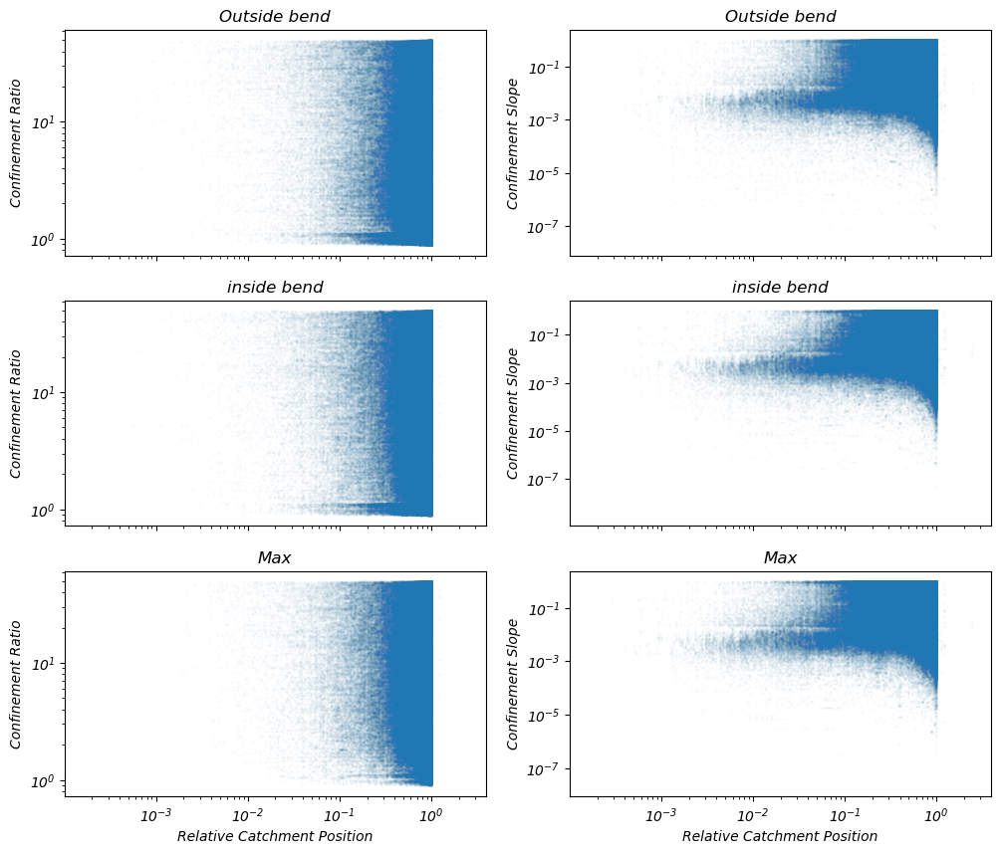

In [117]:
def scatter_plots(ax, xvar, yvar,title,xbool, xlabel, ybool, ylabel, alpha, s):
    ax.scatter(xvar, yvar, s = s, alpha = alpha)
    ax.set_title(title)
    if xbool == True:
        ax.set_xlabel(xlabel)
    if ybool == True:
        ax.set_ylabel(ylabel)
    
    ax.set_xscale('log')
    ax.set_yscale('log')

f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], catchmentPosition, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1], catchmentPosition, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0], catchmentPosition, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1], catchmentPosition, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0], catchmentPosition, ERMax    , 'Max'         , True, 'Relative Catchment Position', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1], catchmentPosition, slopeMax , 'Max'         , True, 'Relative Catchment Position', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

## Scatter with quantiles

In [ ]:
def plot_apex_quant(df, colNameX, colNameY, quant, ax):
    ax.scatter(df[colNameX], df[colNameY], s = 0.1, c = 'blue', alpha = 0.05)
    for col in quant.columns:
        ax.plot(quant.index, quant[col], label = col)
    ax.legend()
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel(colNameX)
    ax.set_ylabel(colNameY)

def bin_quantiles(df, binAxis, quantList, binSteps):
    binCenter = [(binSteps[i] + binSteps[i+1])/2 for i in range(len(binSteps) -1)]
    df['bin'] = pd.cut(df[binAxis], bins = binSteps, labels = binCenter)
    quants = []
    for q in quantList:
        quants.append(df.groupby('bin', as_index = True)[q].quantile([0.1, 0.25, 0.5, 0.75, 0.95]).unstack())
    return quants

### catchment position vs slope

In [ ]:
binSteps = list(np.arange(0,1, 0.1)) +\
            [1,1.5,2]


qOut, qInn, qMax,  qDiff = bin_quantiles(df, 'catchment_position', ['slope_out_angle', 'slope_inn_angle', 'slope_max_angle', 'slope_diff_bendSide_angle'], binSteps)


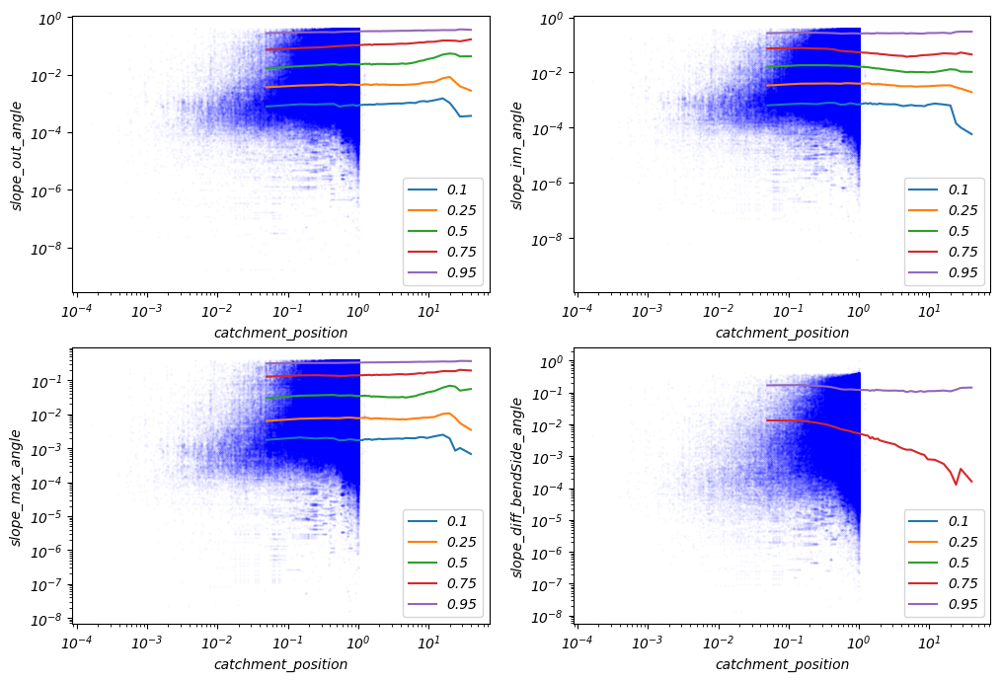

In [217]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
plot_apex_quant(df, 'catchment_position', 'slope_out_angle' , qOut, ax[0,0])
plot_apex_quant(df, 'catchment_position', 'slope_inn_angle' , qInn, ax[0,1])
plot_apex_quant(df, 'catchment_position', 'slope_max_angle' , qMax, ax[1,0])
plot_apex_quant(df, 'catchment_position', 'slope_diff_bendSide_angle', qDiff, ax[1,1])
plt.show()

# qOut, qInn, qMax,  qDiff = bin_quantiles('catchmentPosition', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)

# f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
# plot_apex_quant('catchmentPosition', 'EROut' , qOut, ax[0,0])
# plot_apex_quant('catchmentPosition', 'ERInn' , qInn, ax[0,1])
# plot_apex_quant('catchmentPosition', 'ERMax' , qMax, ax[1,0])
# plot_apex_quant('catchmentPosition', 'ERDiff', qDiff, ax[1,1])
# plt.show()



### Apex vs Slope

In [80]:
binSteps = list(np.arange(1,1000, 50)) +\
            list(np.arange(1000, 2000, 100)) +\
            list(np.arange(2000, 5000, 500)) +\
            [5000, 10000, 20000]

qOut, qInn, qMax,  qDiff = bin_quantiles('apex', ['slopeOut', 'slopeInn', 'slopeMax', 'slopeDiff'], binSteps)


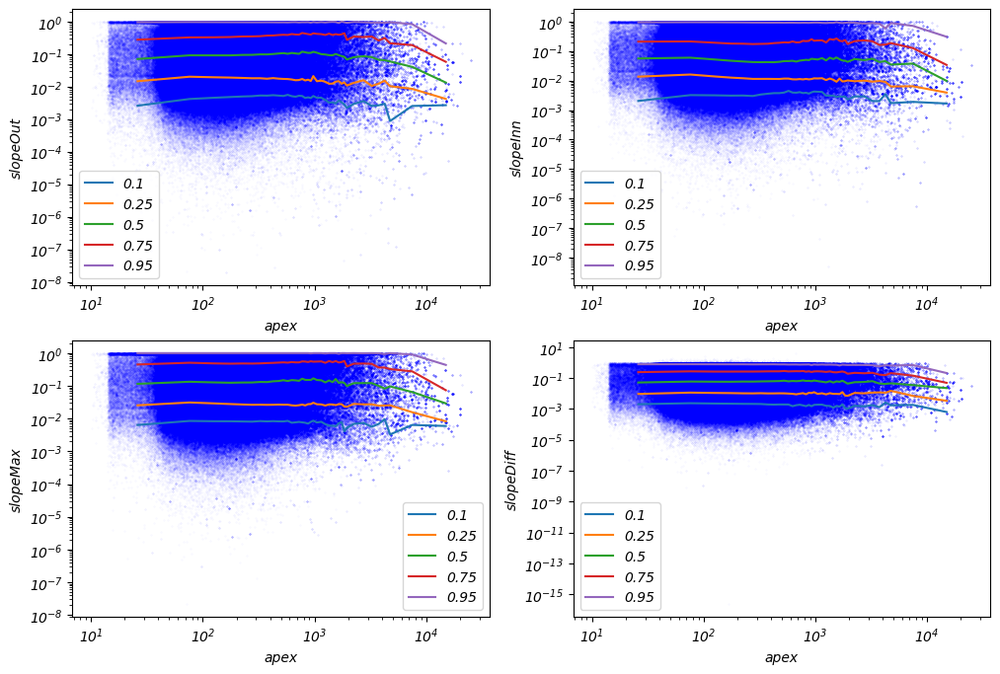

In [81]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8], sharex = False, sharey = False)
plot_apex_quant('apex', 'slopeOut' , qOut, ax[0,0])
plot_apex_quant('apex', 'slopeInn' , qInn, ax[0,1])
plot_apex_quant('apex', 'slopeMax' , qMax, ax[1,0])
plot_apex_quant('apex', 'slopeDiff', qDiff, ax[1,1])
plt.show()

### Amplitude vs ER

In [82]:
binSteps = list(np.arange(1,1000, 50)) +\
            list(np.arange(1000, 2000, 100)) +\
            list(np.arange(2000, 5000, 500)) +\
            [5000, 10000, 20000]


qOut, qInn, qMax,  qDiff = bin_quantiles('apex', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)


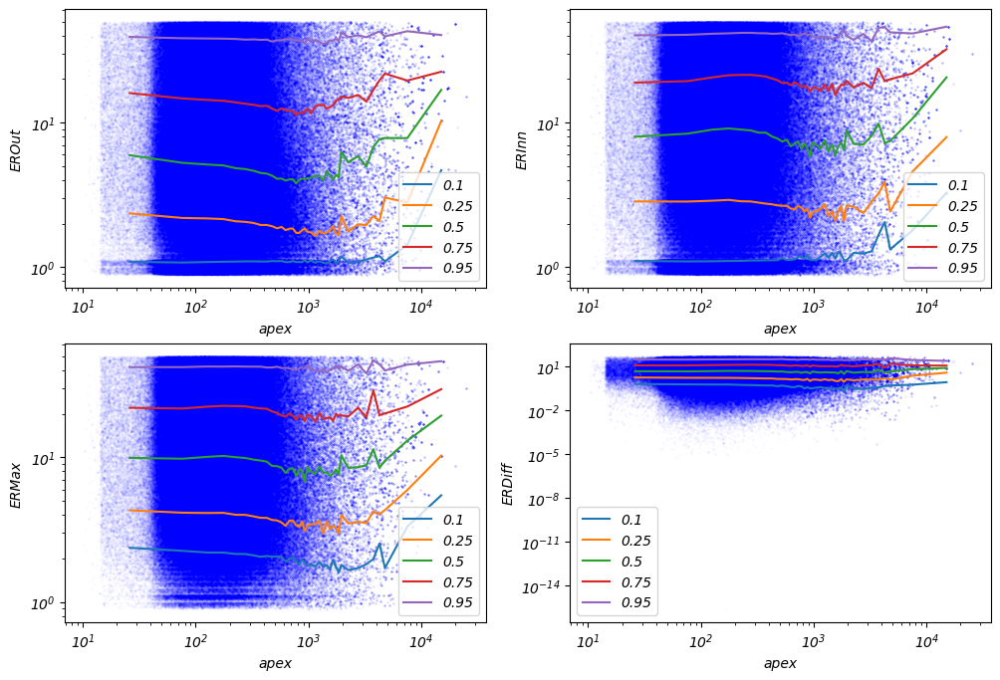

In [83]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant('apex', 'EROut' , qOut, ax[0,0])
plot_apex_quant('apex', 'ERInn' , qInn, ax[0,1])
plot_apex_quant('apex', 'ERMax' , qMax, ax[1,0])
plot_apex_quant('apex', 'ERDiff', qDiff, ax[1,1])
plt.show()

### Amplitude/width vs conf ratio

In [84]:
binSteps = list(np.arange(0,2, 0.1)) +\
            list(np.arange(2,5, 0.5)) +\
            list(np.arange(5,10, 1)) +\
            list(np.arange(10,30, 4)) +\
            [30,50] 

qOut, qInn, qMax,  qDiff = bin_quantiles('bw_apex', ['EROut', 'ERInn', 'ERMax', 'ERDiff'], binSteps)


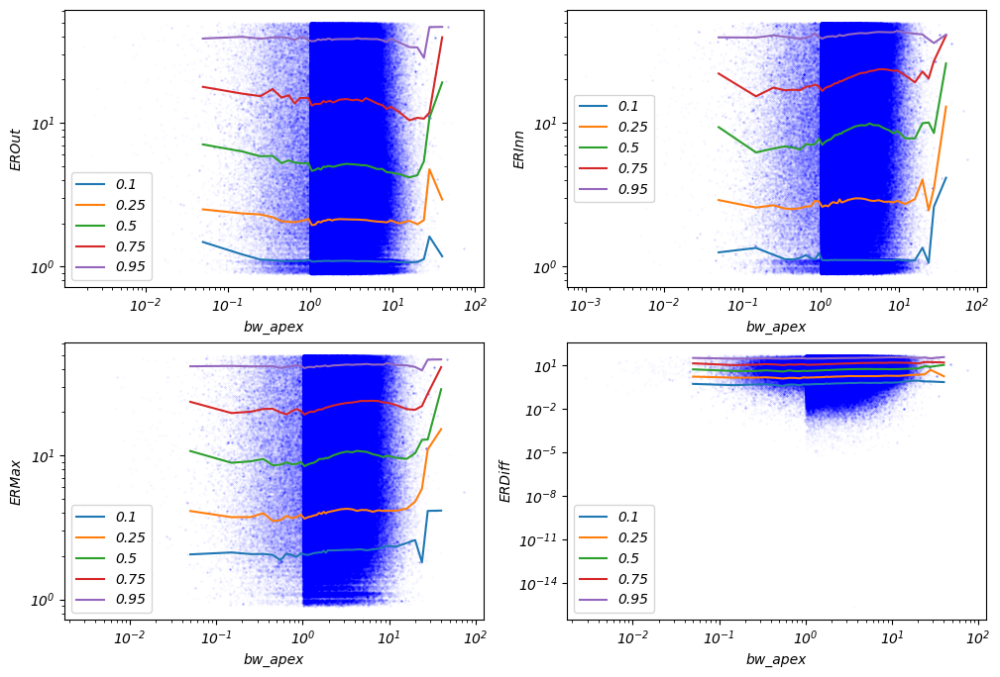

In [85]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant('bw_apex', 'EROut' , qOut, ax[0,0])
plot_apex_quant('bw_apex', 'ERInn' , qInn, ax[0,1])
plot_apex_quant('bw_apex', 'ERMax' , qMax, ax[1,0])
plot_apex_quant('bw_apex', 'ERDiff', qDiff, ax[1,1])
plt.show()


### Amplitude/width vs conf ratio

In [214]:
binSteps = list(np.arange(0,2, 0.1)) +\
            list(np.arange(2,5, 0.5)) +\
            list(np.arange(5,10, 1)) +\
            list(np.arange(10,30, 4)) +\
            [30,50] 

qOut, qInn, qMax,  qDiff = bin_quantiles('nonDimAmp', ['slope_out_angle', 'slope_inn_angle', 'slope_max_angle', 'slope_diff_bendSide_angle'], binSteps)


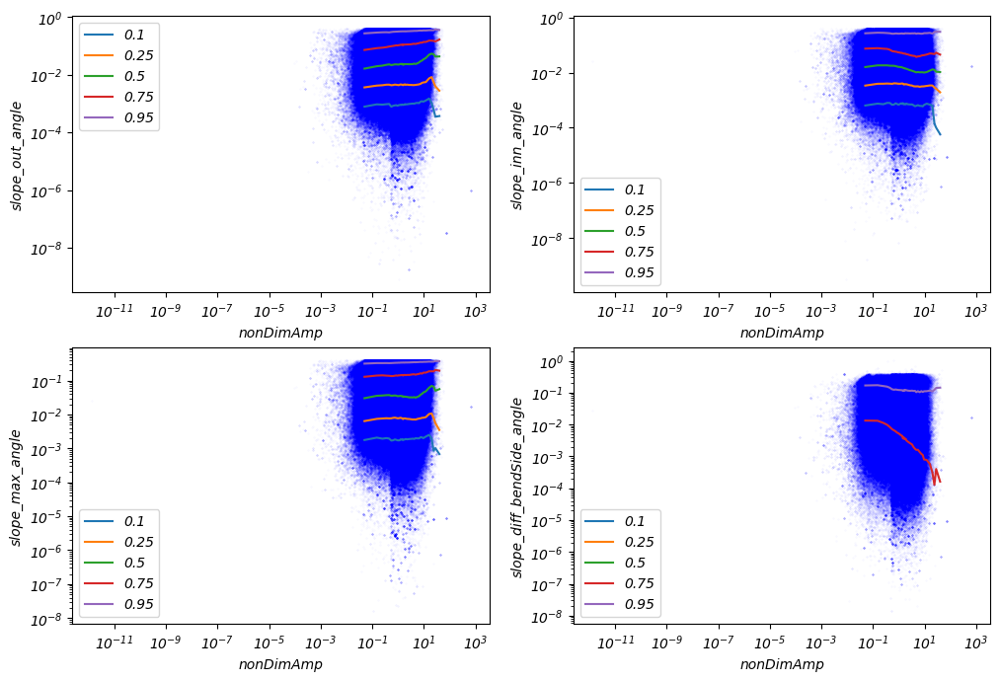

In [215]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = [12, 8])
plot_apex_quant(df,'nonDimAmp', 'slope_out_angle' , qOut, ax[0,0])
plot_apex_quant(df, 'nonDimAmp', 'slope_inn_angle' , qInn, ax[0,1])
plot_apex_quant(df, 'nonDimAmp', 'slope_max_angle' , qMax, ax[1,0])
plot_apex_quant(df, 'nonDimAmp', 'slope_diff_bendSide_angle', qDiff, ax[1,1])
plt.show()


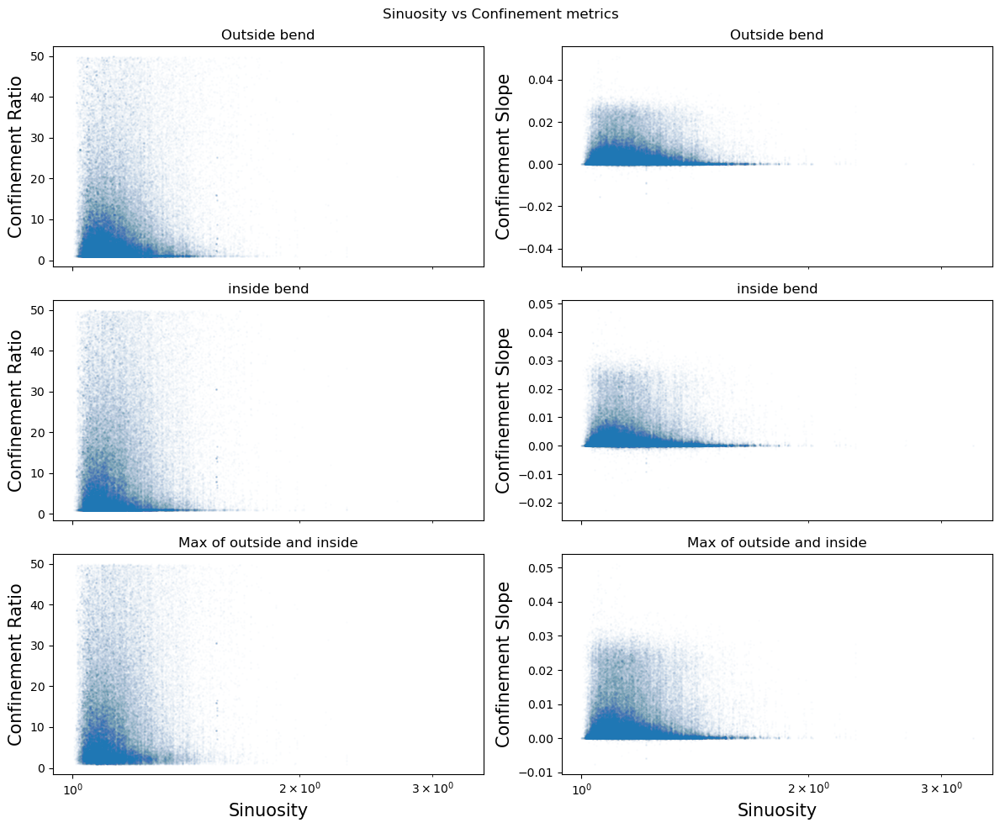

In [104]:
sin = ds.variables['sin'][:]
A = 0.01
f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)

ax1[0].scatter(sin, EROut, s = 1, alpha = A)
ax1[0].set_xscale('log')
ax1[0].set_title('Outside bend')

ax1[1].scatter(sin, slopeOut, s = 1, alpha = A)
ax1[1].set_xscale('log')
ax1[1].set_title('Outside bend')

ax2[0].scatter(sin, ERInn, s = 1, alpha = A)
ax2[0].set_xscale('log')
ax2[0].set_title('inside bend')

ax2[1].scatter(sin, slopeInn, s = 1, alpha = A)
ax2[1].set_xscale('log')
ax2[1].set_title('inside bend')

ax3[0].scatter(sin, ERMax, s = 1, alpha = A)
ax3[0].set_xscale('log')
ax3[0].set_title('Max of outside and inside')

ax3[1].scatter(sin, slopeMax, s = 1, alpha = A)
ax3[1].set_xscale('log')
ax3[1].set_title('Max of outside and inside')

ax1[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax1[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)

ax2[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax2[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)

ax3[0].set_ylabel('Confinement Ratio', fontsize = labelTextSize)
ax3[1].set_ylabel('Confinement Slope', fontsize = labelTextSize)



ax3[0].set_xlabel('Sinuosity', fontsize = labelTextSize)
ax3[1].set_xlabel('Sinuosity', fontsize = labelTextSize)

plt.suptitle('Sinuosity vs Confinement metrics')
plt.tight_layout()
plt.show()

# catchment figures

In [147]:
dsF = ds.where((ds['file'] == 'as') & (ds['networkGraph'] == 723), drop = True)


In [155]:

dsSubset = ds[['ER_inn', 'ER_out', 'slope_inn', 'slope_out',
    'apex', 'catchment_position', 'bendWidths', 'bendMaxWidths']]
dfSubset = dsSubset.to_dataframe().reset_index()
dfSubset['ERMax'] = dfSubset[['ER_out', 'ER_inn']].max(axis = 1)
dfSubset['slopeMax'] = dfSubset[['slope_out', 'slope_inn']].max(axis = 1)

apex  = dfSubset['apex'].values
bendWidth = dfSubset['bendWidths'].values
EROut = dfSubset['ER_out'].values
ERInn = dfSubset['ER_inn'].values
ERMax = dfSubset['ERMax'].values

slopeOut = dfSubset['slope_out'].values
slopeInn = dfSubset['slope_inn'].values
slopeMax = dfSubset['slopeMax'].values
catchmentPosition = dfSubset['catchment_position'].values


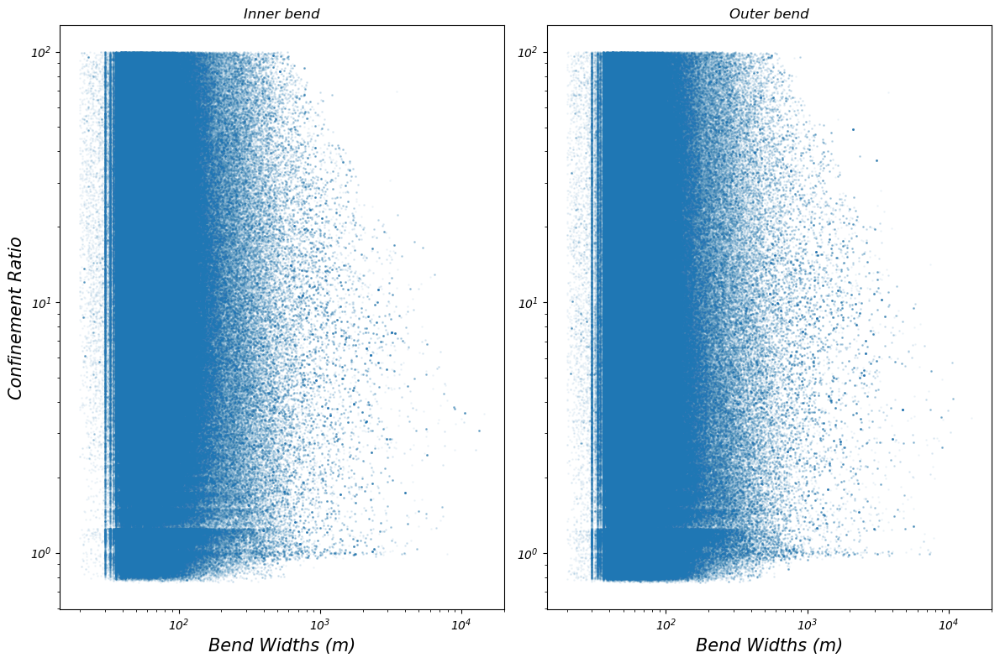

In [202]:
scatter_plot(df, 1, 2, ['bendWidths', 'bendWidths'], ['ER_inn', 'ER_out'], ['Bend Widths (m)', 'Bend Widths (m)'], ['Confinement Ratio'], ['Inner bend', 'Outer bend'])

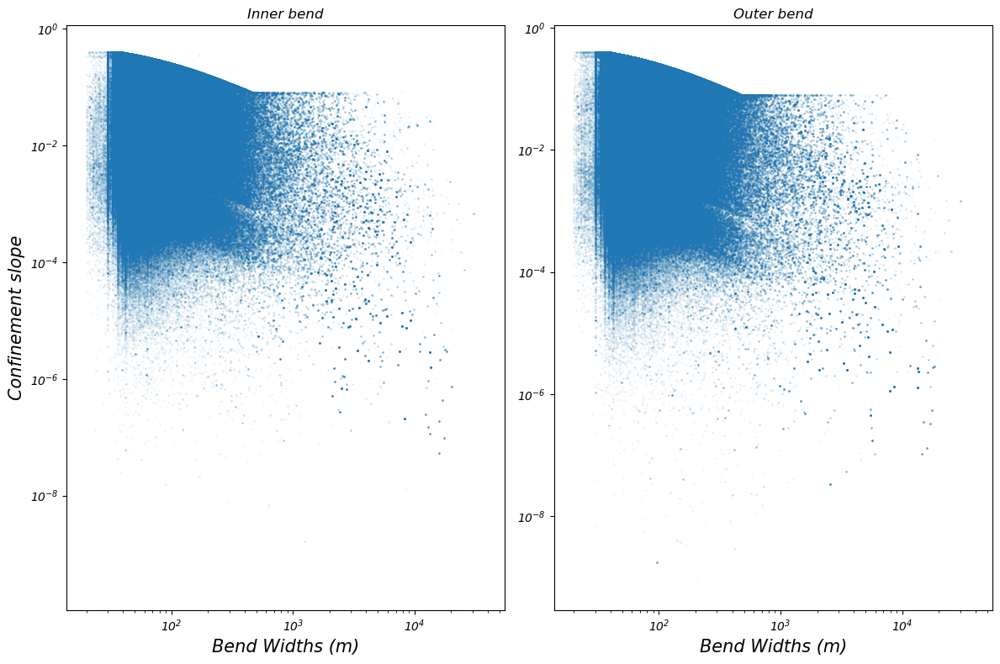

In [ ]:
scatter_plot(df, 1, 2, ['bendWidths', 'bendWidths'], ['slope_inn_angle', 'slope_out_angle'], ['Amplitude / Bend Widths', 'Amplitude/Bend Widths (m)'], ['Confinement slope'], ['Inner bend', 'Outer bend'])

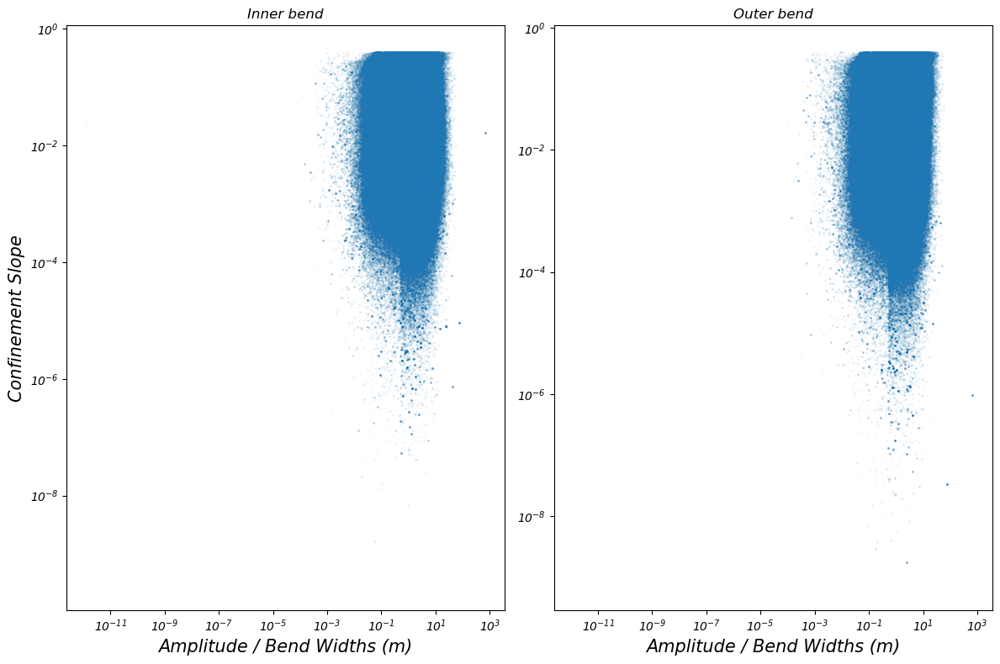

In [207]:
scatter_plot(df, 1, 2, ['nonDimAmp', 'nonDimAmp'], ['slope_inn_angle', 'slope_out_angle'], ['Amplitude / Bend Widths (m)', 'Amplitude / Bend Widths (m)'], ['Confinement Slope'], ['Inner bend', 'Outer bend'])

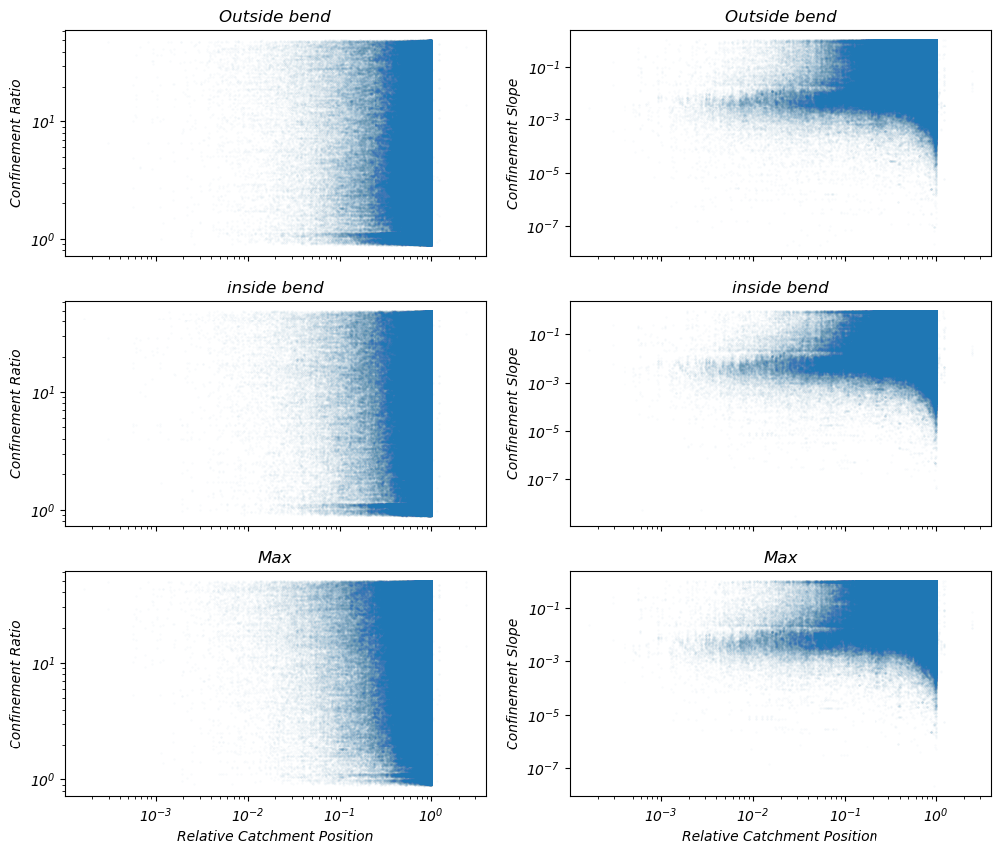

In [ ]:


f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], catchmentPosition, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1], catchmentPosition, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0], catchmentPosition, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1], catchmentPosition, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0], catchmentPosition, ERMax    , 'Max'         , True, 'Relative Catchment Position', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1], catchmentPosition, slopeMax , 'Max'         , True, 'Relative Catchment Position', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

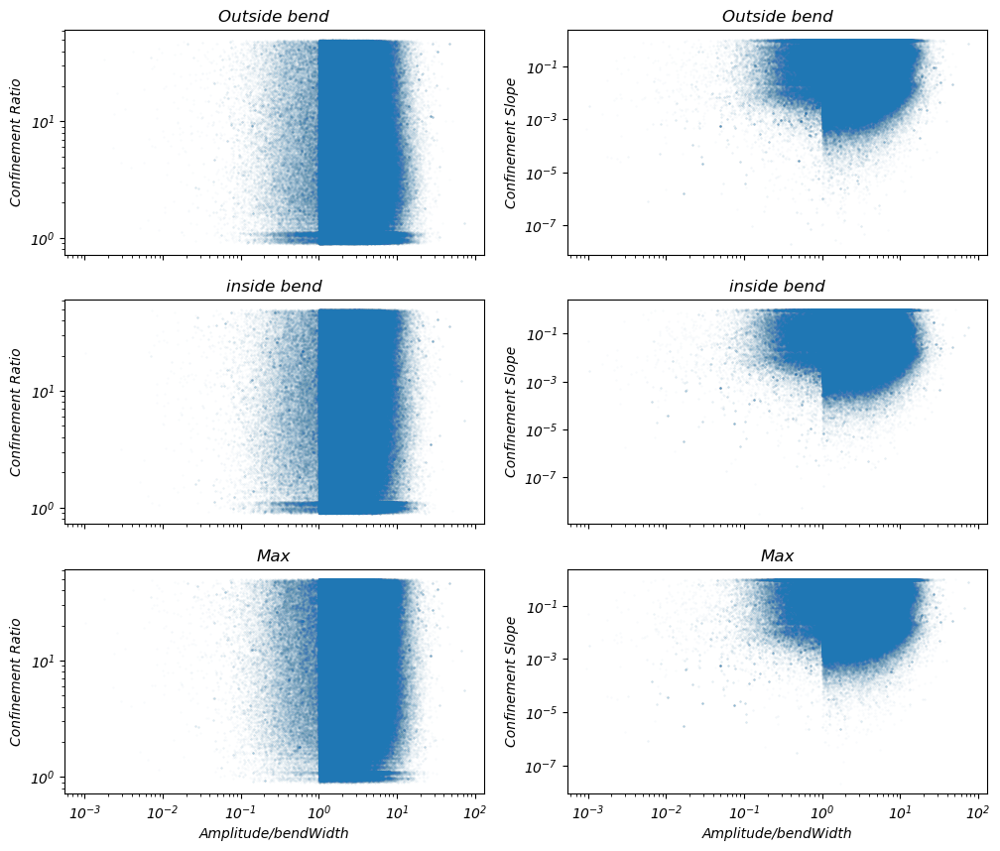

In [156]:

f, [ax1, ax2, ax3] = plt.subplots(nrows = 3, ncols = 2, figsize = [12,10], 
                                  sharex = True, sharey=False)
scatter_plots(ax1[0], apex/bendWidth, EROut    , 'Outside bend', False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax1[1],  apex/bendWidth, slopeOut , 'Outside bend', False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax2[0],  apex/bendWidth, ERInn    , 'inside bend' , False, '', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax2[1],  apex/bendWidth, slopeInn , 'inside bend' , False, '', True, 'Confinement Slope', scatterAlpha, scatterSize)
scatter_plots(ax3[0],  apex/bendWidth, ERMax    , 'Max'         , True, 'Amplitude/bendWidth', True , 'Confinement Ratio', scatterAlpha, scatterSize)
scatter_plots(ax3[1],  apex/bendWidth, slopeMax , 'Max'         , True, 'Amplitude/bendWidth', True, 'Confinement Slope', scatterAlpha, scatterSize)
plt.show()

# TEST

In [88]:
F = glob(directory + 'input/SWOT_vector/*v17.gpkg')
f = glob(directory + 'results/all/af_00_50.csv')[0]
f

'/scratch/6256481/results/all/af_00_50.csv'

In [89]:
dfInput = gpd.read_file(F[0]) #'EPSG:4326'
dfRAll = pd.read_csv(f) #'wkt'
dfBend = gpd.read_file(directory + 'results/single_values/af_00_50_conf.gpkg') #'EPSG:4326'

In [153]:
# code transform
def get_line_t(D, r):
    row = D[D['reach_id'] == r].iloc[0]
    row['bendLines']  = ast.literal_eval(row['bendLines'])

    d = gpd.GeoDataFrame({'geometry':shapely.from_wkt(row['bendLines'])}
                            , index = [0], crs = 'EPSG:32735')

    # d = d.set_crs(row['localCRS'])
    l1 = d.iloc[0].geometry
    d1 = d.to_crs('EPSG:4326').copy()
    l2 = d1['geometry'].iloc[0]
    return shapely.from_wkt(row['bendLines'])[0], l1,l2
12291300121

l11, l12,l13 = get_line_t(dfRAll, 12291300121)
l21, l22,l23 = get_line_t(dfRAll, 12291300081)

# li1 = dfInput[dfInput['reach_id'] == 12291300121]['geometry'].iloc[0]
# li2 = dfInput[dfInput['reach_id'] == 12291300081]['geometry'].iloc[0]
# row2= dfRAll[dfRAll['reach_id'] == 12291300111].iloc[0]
# row2['bendLines'] = ast.literal_eval(row2['bendLines'])

# row3= dfRAll[dfRAll['reach_id'] == 12291300101].iloc[0]
# row3['bendLines'] = ast.literal_eval(row3['bendLines'])

# row4= dfRAll[dfRAll['reach_id'] == 12291300091.0].iloc[0]
# row4['bendLines'] = ast.literal_eval(row4['bendLines'])

# row5= dfRAll[dfRAll['reach_id'] == 12291300081].iloc[0]
# row5['bendLines'] = ast.literal_eval(row5['bendLines'])


# D = gpd.GeoDataFrame({'geometry':shapely.from_wkt(row['bendLines'])}
#                             , index = [0], crs = r['localCRS'])

# dfBendN = dfBend.to_crs('EPSG:4326')
# bendGeom = dfBendN['geometry'].iloc[0]
# bendGeom


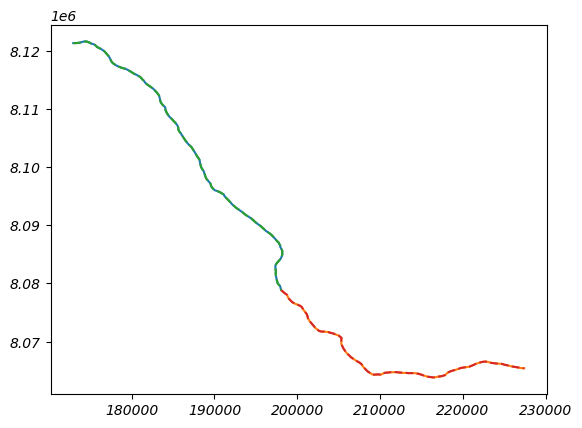

In [147]:
# plot in local crs
plt.plot(*l11.xy)
plt.plot(*l21.xy)

plt.plot(*l12.xy, linestyle = '--')
plt.plot(*l22.xy, linestyle = '--')


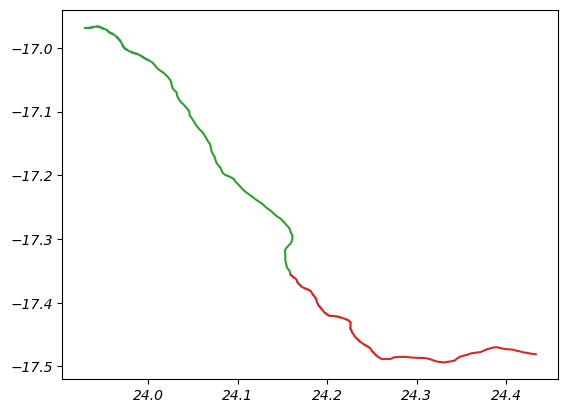

In [154]:
plt.plot(*li1.xy, linestyle = '--')
plt.plot(*li2.xy, linestyle = '--')

plt.plot(*l13.xy)
plt.plot(*l23.xy)

In [46]:
A = D[D['combined_reach_id'].isin([3005, 3006, 3007, 3008, 3009])]
B = D[D['reach_id'] == 12291300121]
b = d[d['reach_id'] == 12291300121]

In [21]:
dfEG = df.groupby('reach_id').agg({
'ER_out':'mean',
'ER_inn':'mean',
'slope_out':'mean',
'slope_inn': 'mean',
'ER_left':'mean',
'ER_right':'mean',
'slope_left':'mean',
'slope_right': 'mean',

'catchment_position':'first'}).copy()
dfEG['ERMax']    = dfEG[['ER_out', 'ER_inn']].max(axis = 1)
dfEG['ERMin']    = dfEG[['ER_out', 'ER_inn']].max(axis = 1)

dfEG['slopeMax'] = dfEG[['slope_out', 'slope_inn']].max(axis = 1)
dfEG['slopeMin'] = dfEG[['slope_out', 'slope_inn']].max(axis = 1)

In [22]:
dfEG

,ER_out,ER_inn,slope_out,slope_inn,ER_left,ER_right,slope_left,slope_right,catchment_position,ERMax,ERMin,slopeMax,slopeMin
reach_id,,,,,,,,,,,,,
11410000023,18.379620,33.409958,0.056713,0.035665,27.173386,27.30828,0.068428,0.023949,0.005285,33.409958,33.409958,0.056713,0.056713
11410000031,95.042799,96.828866,0.007641,0.006065,95.638154,NaN,0.006010,0.007696,0.009690,96.828866,96.828866,0.007641,0.007641
11410000041,NaN,NaN,0.003526,0.003348,NaN,NaN,0.003504,0.003370,0.014072,NaN,NaN,0.003526,0.003526
11430000011,NaN,NaN,0.000220,0.001147,NaN,NaN,0.000340,0.001028,0.018802,NaN,NaN,0.001147,0.001147
11430000021,NaN,NaN,-0.000243,0.000679,NaN,NaN,0.000522,-0.000087,0.023406,NaN,NaN,0.000679,0.000679
...,...,...,...,...,...,...,...,...,...,...,...,...,...
91450100071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.320474,NaN,NaN,NaN,NaN
91450100091,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.333052,NaN,NaN,NaN,NaN
91450100101,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.665995,NaN,NaN,NaN,NaN
